In [21]:
from utils.ifa_meander_project_v2.geometry import *
from utils.ifa_meander_project_v2.meshing import *
from utils.ifa_meander_project_v2.frequency import *
from utils.ifa_meander_project_v2.simulation import *
from utils.gmsh_function import extract_msh_to_mat
from efield.efield4 import plot_s11_curve, plot_s11_curve_MoM_vs_Experiment, plot_s11_curve_CST_MoM, calculate_bandwidth

In [ ]:
"""fLow = 420e6
fHigh = 446e6
fC = 433e6
step = 1e6"""

fLow = 400e6
fHigh = 466e6
fC = 431.2e6
step = 0.2e6

frequencies, fc_index, nPoints = generate_frequencies_2(fLow, fHigh, fC, step)

print(f"Number of frequencies (nPoints) : {nPoints}")
print(f"Index of fC : {fc_index}")

Number of frequencies (nPoints) : 331
Index of fC : 156


In [23]:
mesh_name = "sim_optimize_ifa.msh"
save_mesh_folder = 'data/gmsh_files/'
ifa_meander_mat = 'data/antennas_mesh/sim_optimize_ifa.mat'
ifa_meander_msh = save_mesh_folder + mesh_name

In [24]:
a = 40 / 1000  # Height of the free space
b = 53.98 / 1000  # width of the free space

terminal_a = 85.60 / 1000
terminal_b = b
x_t = np.array([-terminal_a + a, 0, 0, -terminal_a + a])
y_t = np.array([terminal_b, terminal_b, 0, 0])

# Fix the short feed and track width
largeur_piste    = 1.982 / 1000
distance_meandre = 2.018 / 1000
feed = 37.869 / 1000
feed_point = np.array([0, feed, 0])

"""largeur_piste    = 1.788 / 1000
distance_meandre = 2.018 / 1000
feed = 40.415 / 1000
feed_point = np.array([0, feed, 0])"""

# mesh_size = 3 * largeur_piste

mesh_size = 9.47 / 1000
print(f"Mesh size : {mesh_size * 1000:.2f} mm")

Mesh size : 9.47 mm


In [25]:
def creation_ifa(largeur, hauteur, width, dist_meandre, feed, x_t, y_t, save_mesh_folder, mesh_name, mesh_size):
    x, y, N, distance_meandre = ifa_creation(largeur, hauteur, width, dist_meandre)
    x_m, y_m = trace_meander(x, y, width)
    feed_wid = width # The track width is the same everywhere
    feed_x = np.array([0, distance_meandre, distance_meandre, 0])
    feed_y = np.array([feed + feed_wid/2, feed + feed_wid/2, feed -feed_wid/2, feed - feed_wid/2])
    antenna_ifa_meander(x_m, y_m, x_t, y_t, feed_x, feed_y, save_mesh_folder, mesh_name, mesh_size)
    extract_msh_to_mat(ifa_meander_msh, ifa_meander_mat)
    return N, distance_meandre

In [26]:
Z_adapt = 50

distance meandres 2.018 mm
IFA track width 1.9819999999999998 mm
feed position = 37.869 mm

Number of meanders 10
New meander distance 2.0180000000000002 mm
Simulation 1/331 | f = 400.00 MHz | S11 = -0.18 dB
Simulation 2/331 | f = 400.20 MHz | S11 = -0.18 dB
Simulation 3/331 | f = 400.40 MHz | S11 = -0.18 dB
Simulation 4/331 | f = 400.60 MHz | S11 = -0.18 dB
Simulation 5/331 | f = 400.80 MHz | S11 = -0.19 dB
Simulation 6/331 | f = 401.00 MHz | S11 = -0.19 dB
Simulation 7/331 | f = 401.20 MHz | S11 = -0.19 dB
Simulation 8/331 | f = 401.40 MHz | S11 = -0.19 dB
Simulation 9/331 | f = 401.60 MHz | S11 = -0.20 dB
Simulation 10/331 | f = 401.80 MHz | S11 = -0.20 dB
Simulation 11/331 | f = 402.00 MHz | S11 = -0.20 dB
Simulation 12/331 | f = 402.20 MHz | S11 = -0.21 dB
Simulation 13/331 | f = 402.40 MHz | S11 = -0.21 dB
Simulation 14/331 | f = 402.60 MHz | S11 = -0.21 dB
Simulation 15/331 | f = 402.80 MHz | S11 = -0.22 dB
Simulation 16/331 | f = 403.00 MHz | S11 = -0.22 dB
Simulation 17/331 | 

Simulation 157/331 | f = 431.20 MHz | S11 = -12.86 dB
Simulation 158/331 | f = 431.40 MHz | S11 = -12.85 dB
Simulation 159/331 | f = 431.60 MHz | S11 = -12.72 dB
Simulation 160/331 | f = 431.80 MHz | S11 = -12.49 dB
Simulation 161/331 | f = 432.00 MHz | S11 = -12.18 dB
Simulation 162/331 | f = 432.20 MHz | S11 = -11.80 dB
Simulation 163/331 | f = 432.40 MHz | S11 = -11.38 dB
Simulation 164/331 | f = 432.60 MHz | S11 = -10.93 dB
Simulation 165/331 | f = 432.80 MHz | S11 = -10.46 dB
Simulation 166/331 | f = 433.00 MHz | S11 = -10.00 dB
Simulation 167/331 | f = 433.20 MHz | S11 = -9.55 dB
Simulation 168/331 | f = 433.40 MHz | S11 = -9.10 dB
Simulation 169/331 | f = 433.60 MHz | S11 = -8.68 dB
Simulation 170/331 | f = 433.80 MHz | S11 = -8.27 dB
Simulation 171/331 | f = 434.00 MHz | S11 = -7.88 dB
Simulation 172/331 | f = 434.20 MHz | S11 = -7.51 dB
Simulation 173/331 | f = 434.40 MHz | S11 = -7.15 dB
Simulation 174/331 | f = 434.60 MHz | S11 = -6.82 dB
Simulation 175/331 | f = 434.80 MHz 


📡 Simulation results:
→ Resonance frequency = 431.20 MHz
→ Impedance at f_res  = 51.13-23.58j Ω


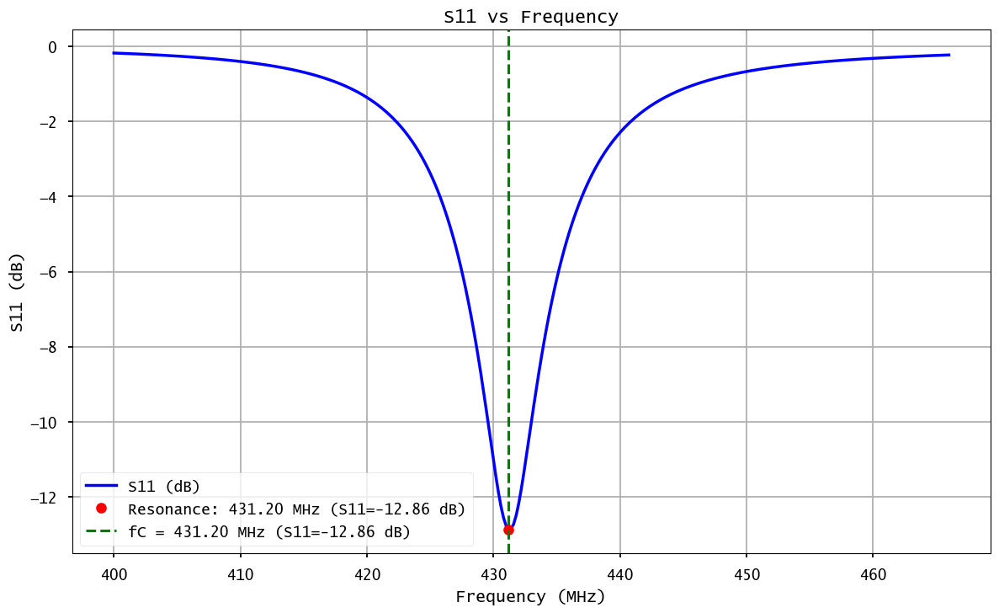


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB



(np.float64(7.4), np.float64(427600000.0), np.float64(435000000.0))

In [27]:
print(f"distance meandres {distance_meandre * 1000} mm")
print(f"IFA track width {largeur_piste * 1000} mm")
print(f"feed position = {feed * 1000} mm\n")

# Create the IFA antenna with meander
N_list_elem, new_distance_meandre_elem = creation_ifa(a, b, largeur_piste, distance_meandre, feed, x_t, y_t, save_mesh_folder, mesh_name, mesh_size)

print(f"Number of meanders {N_list_elem}")
print(f"New meander distance {new_distance_meandre_elem * 1000} mm")

# Simulate S11 and impedance at feed point
_, s11_db, _, _, impedances_simulated = simulate_433_project(frequencies, ifa_meander_mat, fC, feed_point, Z0=Z_adapt)

# Plot S11 curve
plot_s11_curve(s11_db, fLow, fHigh, fC, show_min=True)

calculate_bandwidth(frequencies, s11_db, threshold=-6)

In [28]:
# ============================================================================
# FUNCTIONS
# ============================================================================

def add_series_capacitor(impedances, frequencies, C):
    """Add series capacitor to impedances"""
    frequencies = np.array(frequencies)  # Ensure frequencies is a numpy array
    impedances = np.array(impedances)    # Ensure impedances is a numpy array
    X_cap = -1 / (2 * np.pi * frequencies * C)  # Capacitive reactance
    Z_cap = 1j * X_cap
    return impedances + Z_cap

def add_parallel_capacitor_inductor(impedances, frequencies, C, L):
    frequencies = np.array(frequencies)  # Ensure frequencies is a numpy array
    impedances = np.array(impedances)    # Ensure impedances is a numpy array

    # Admittance of the inductor and capacitor
    Y_L = 1 / (1j * 2 * np.pi * frequencies * L)  # Admittance of inductor
    Y_C = 1j * 2 * np.pi * frequencies * C        # Admittance of capacitor

    # antenna admittance
    Y_ant = 1 / impedances

    # Total admittance
    Y_total = Y_ant + Y_L + Y_C

    # Convert back to impedance
    Z_total = 1 / Y_total

    return Z_total

def add_shunt_capacitor(impedances, frequencies, C):
    """Add series capacitor to impedances"""
    """frequencies = np.array(frequencies)  # Ensure frequencies is a numpy array
    impedances = np.array(impedances)    # Ensure impedances is a numpy array"""
    # Admittance de l'antenne
    Y_ant = 1 / impedances

    # Admittance de la capacité shunt
    Y_cap = 1j * 2 * np.pi * frequencies * C

    # Admittance totale (on additionne les admittances en parallèle)
    Y_total = Y_ant + Y_cap

    # Conversion en impédance
    return 1 / Y_total

def calculate_s11_db(impedance, z0):
    """Calculate S11 in dB from impedance"""
    s11 = (impedance - z0) / (impedance + z0)
    s11_db = 20 * np.log10(np.abs(s11))
    return s11_db, s11



                                                                   Iteration 1                                                                   
L = 0.01 nH, C = 13623.31 pF


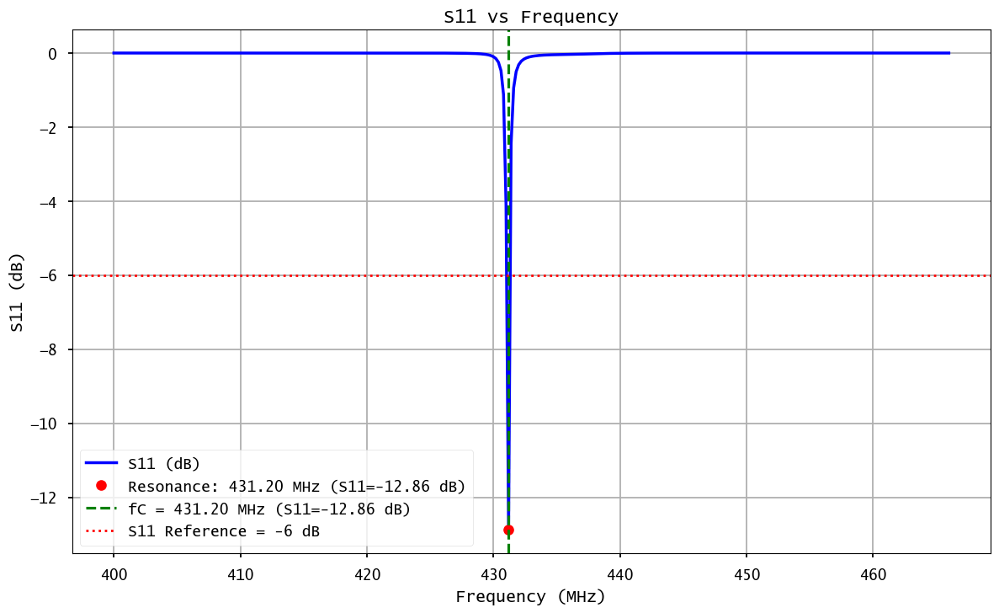


🔹 Bandwidth: 0.00 MHz
   - f_min = 0.431 GHz
   - f_max = 0.431 GHz
   - Threshold = -6 dB


                                                                   Iteration 2                                                                   
L = 0.11 nH, C = 1238.48 pF


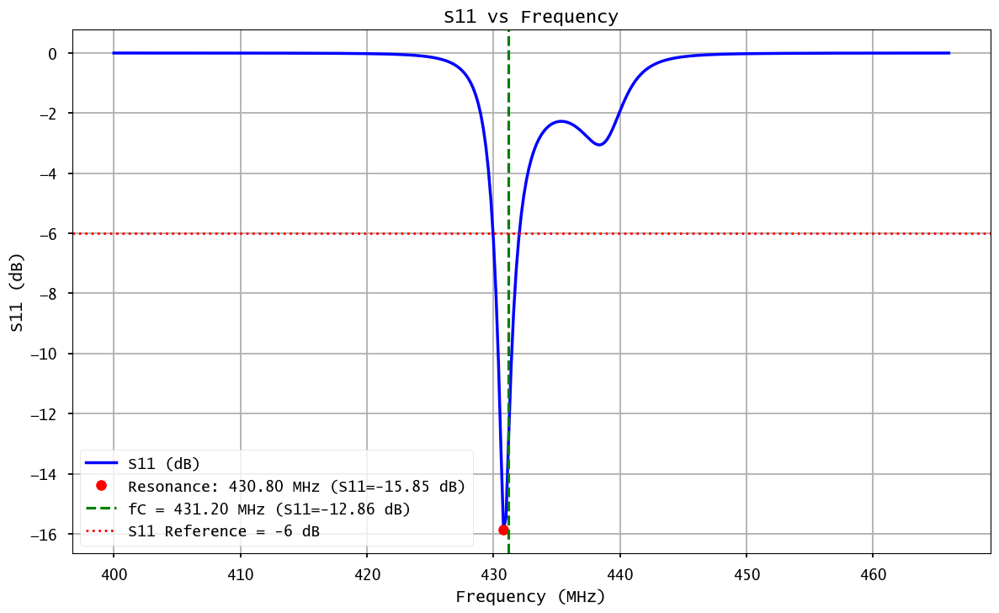


🔹 Bandwidth: 2.00 MHz
   - f_min = 0.430 GHz
   - f_max = 0.432 GHz
   - Threshold = -6 dB


                                                                   Iteration 3                                                                   
L = 0.21 nH, C = 648.73 pF


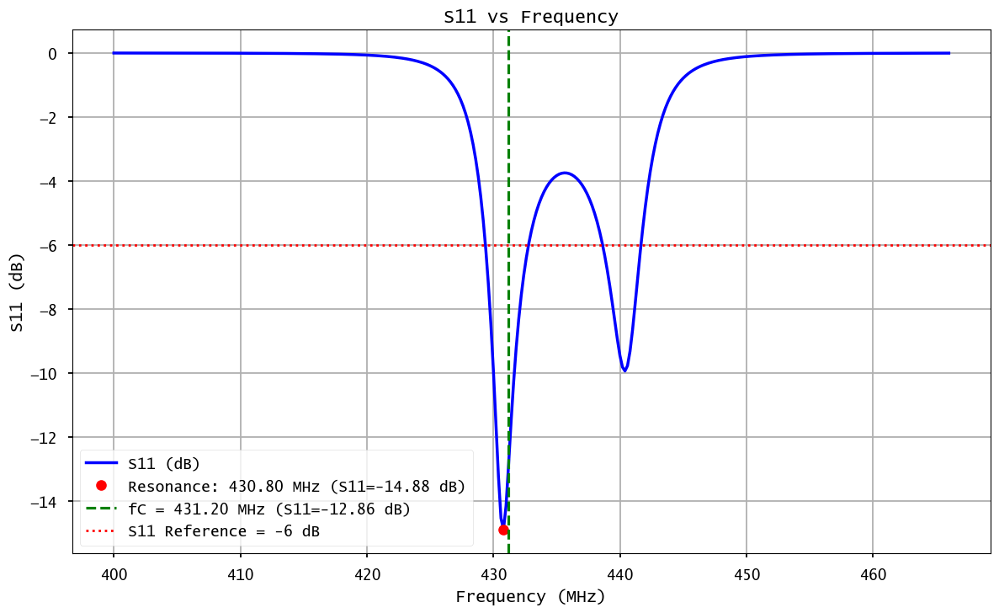


🔹 Bandwidth: 12.20 MHz
   - f_min = 0.429 GHz
   - f_max = 0.442 GHz
   - Threshold = -6 dB


                                                                   Iteration 4                                                                   
L = 0.31 nH, C = 439.46 pF


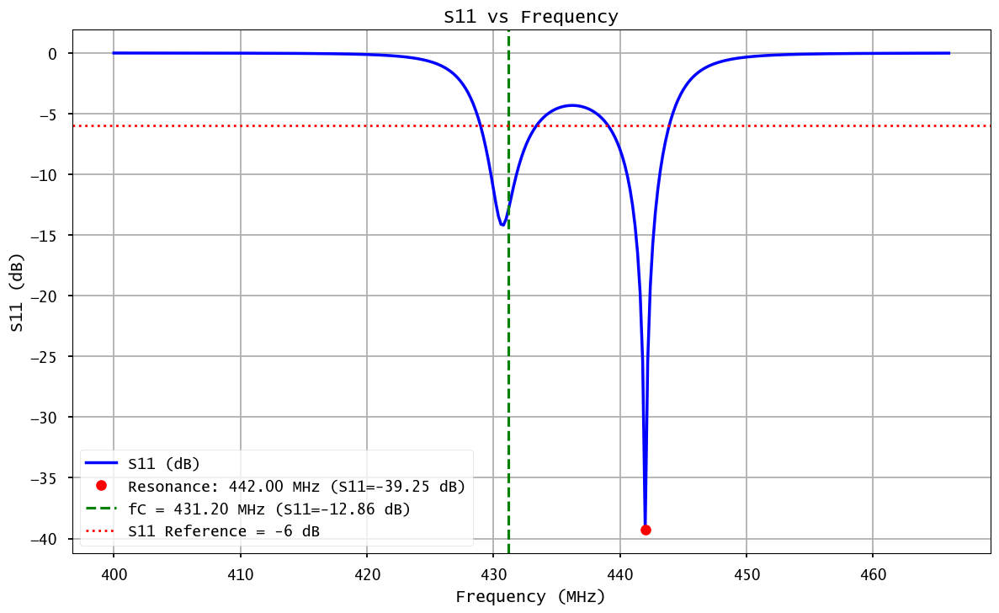


🔹 Bandwidth: 14.80 MHz
   - f_min = 0.429 GHz
   - f_max = 0.444 GHz
   - Threshold = -6 dB


                                                                   Iteration 5                                                                   
L = 0.41 nH, C = 332.28 pF


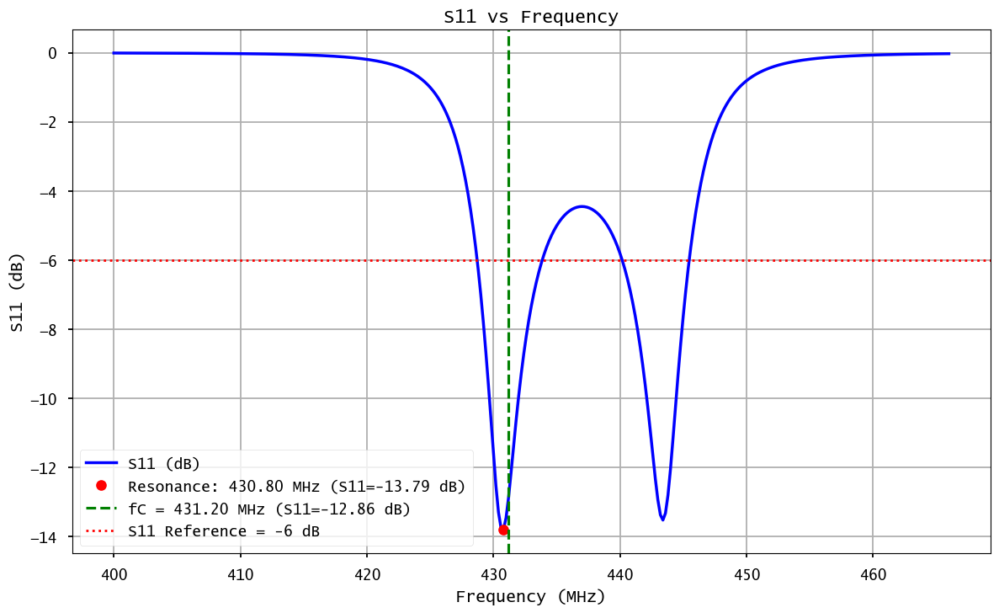


🔹 Bandwidth: 16.60 MHz
   - f_min = 0.429 GHz
   - f_max = 0.445 GHz
   - Threshold = -6 dB


                                                                   Iteration 6                                                                   
L = 0.51 nH, C = 267.12 pF


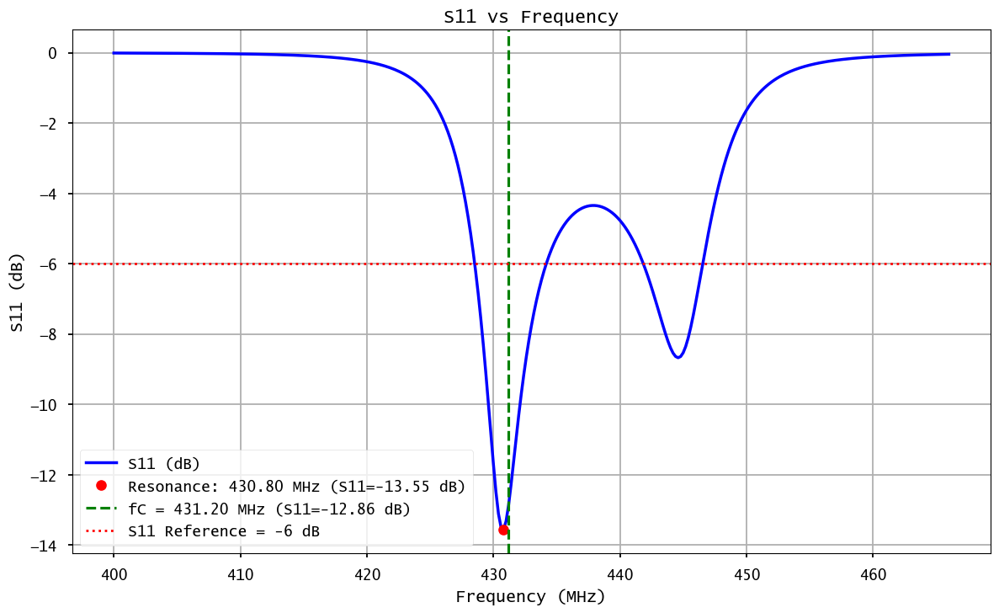


🔹 Bandwidth: 17.80 MHz
   - f_min = 0.429 GHz
   - f_max = 0.446 GHz
   - Threshold = -6 dB


                                                                   Iteration 7                                                                   
L = 0.61 nH, C = 223.33 pF


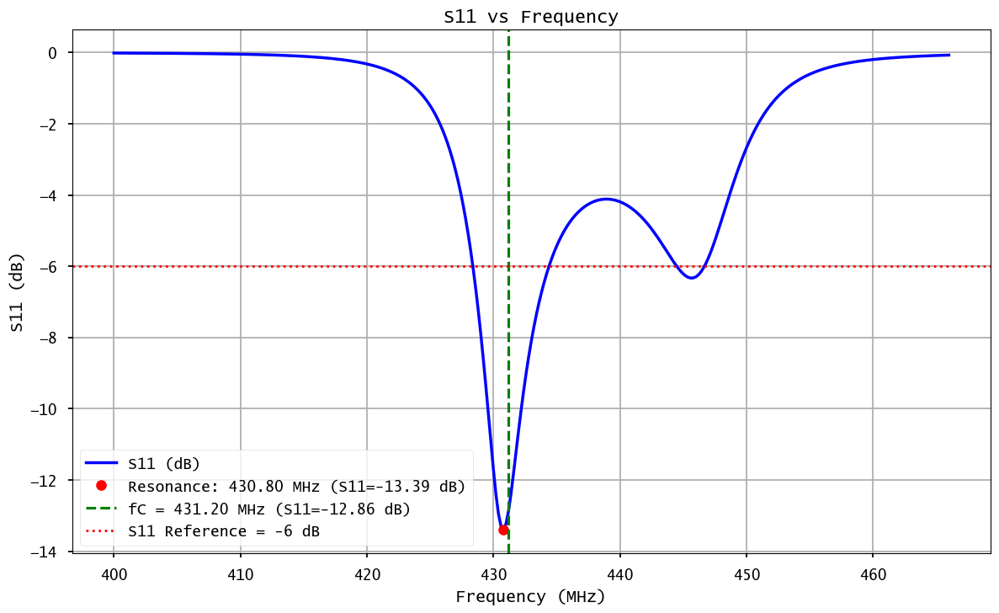


🔹 Bandwidth: 18.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.447 GHz
   - Threshold = -6 dB


                                                                   Iteration 8                                                                   
L = 0.71 nH, C = 191.88 pF


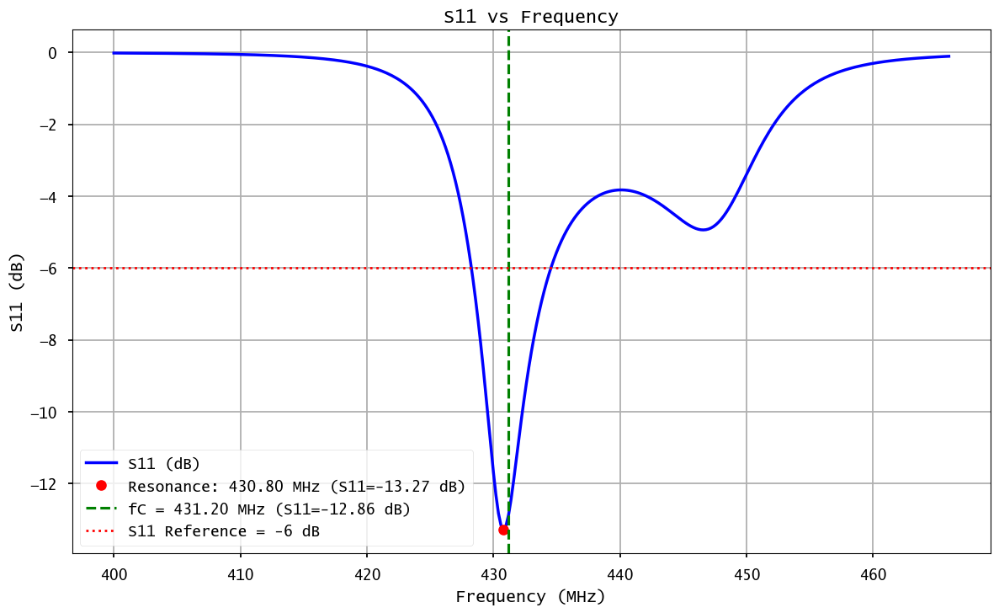


🔹 Bandwidth: 6.00 MHz
   - f_min = 0.428 GHz
   - f_max = 0.434 GHz
   - Threshold = -6 dB


                                                                   Iteration 9                                                                   
L = 0.81 nH, C = 168.19 pF


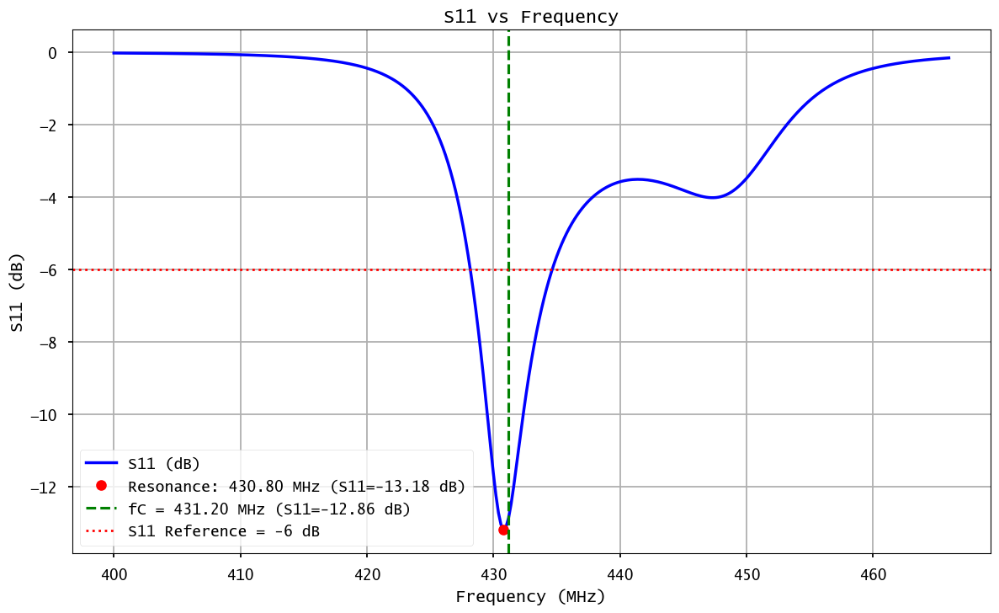


🔹 Bandwidth: 6.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 10                                                                   
L = 0.91 nH, C = 149.71 pF


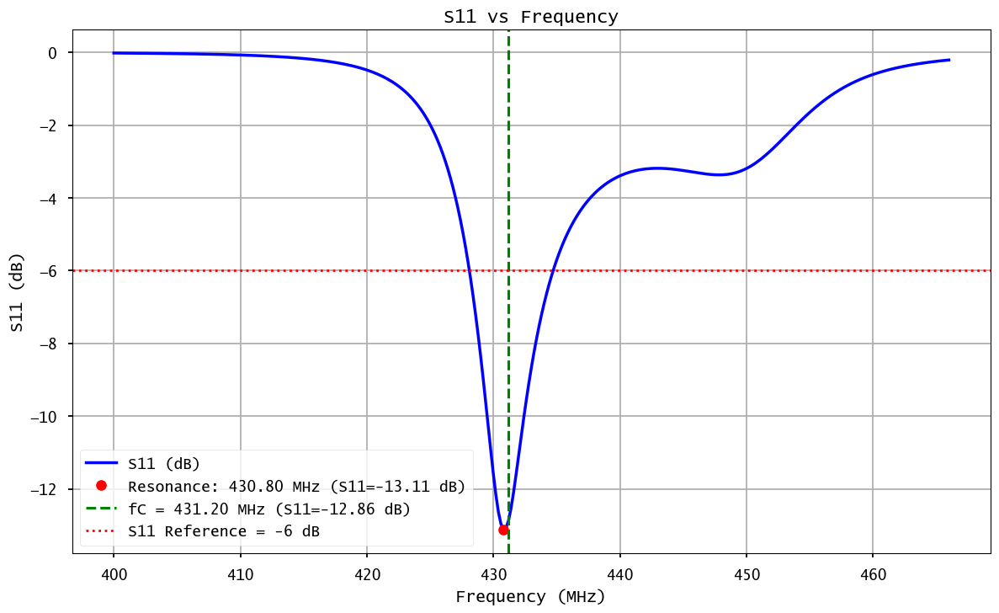


🔹 Bandwidth: 6.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 11                                                                   
L = 1.01 nH, C = 134.88 pF


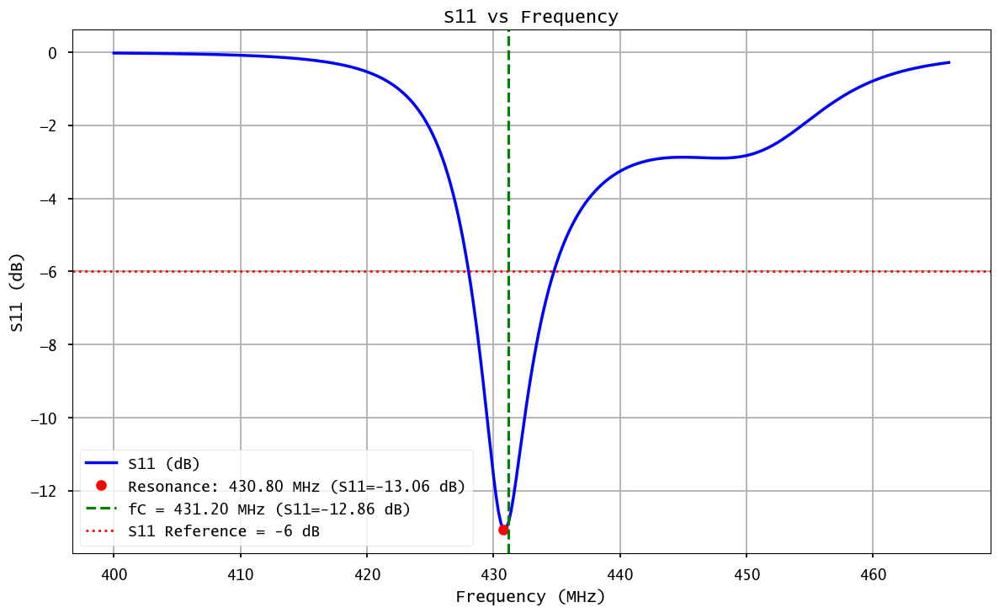


🔹 Bandwidth: 6.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 12                                                                   
L = 1.11 nH, C = 122.73 pF


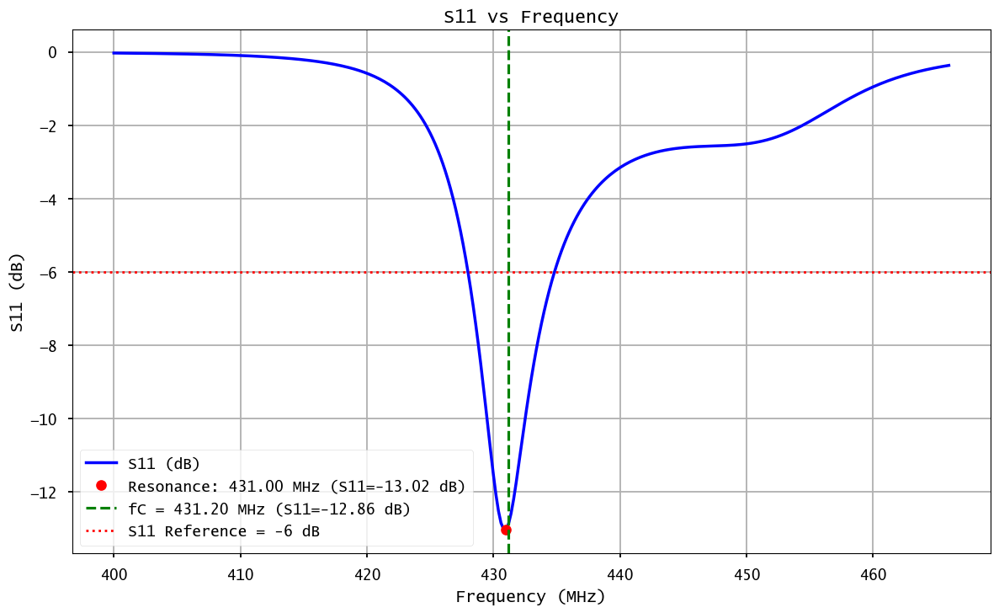


🔹 Bandwidth: 6.80 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 13                                                                   
L = 1.21 nH, C = 112.59 pF


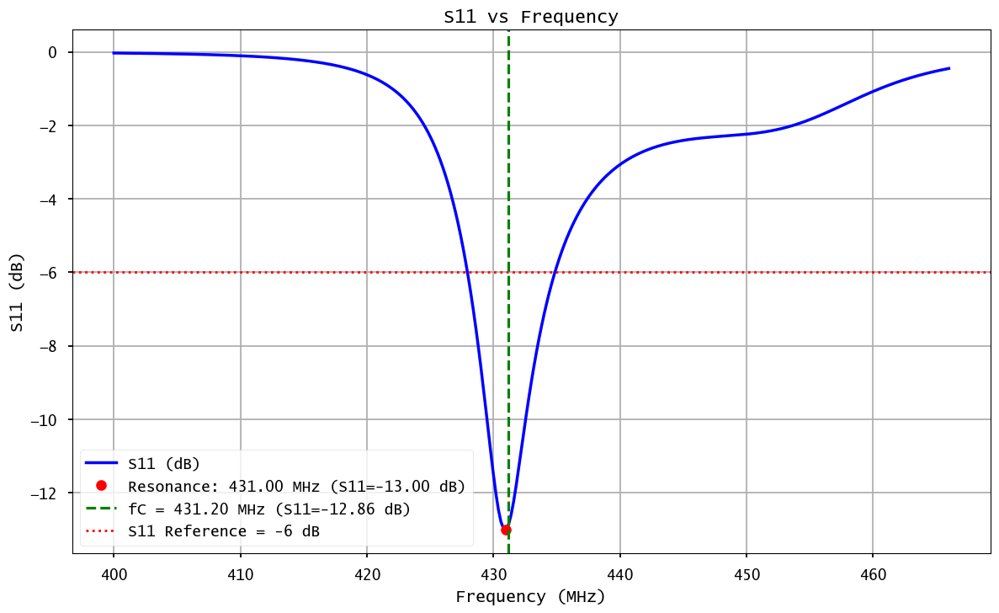


🔹 Bandwidth: 6.80 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 14                                                                   
L = 1.31 nH, C = 103.99 pF


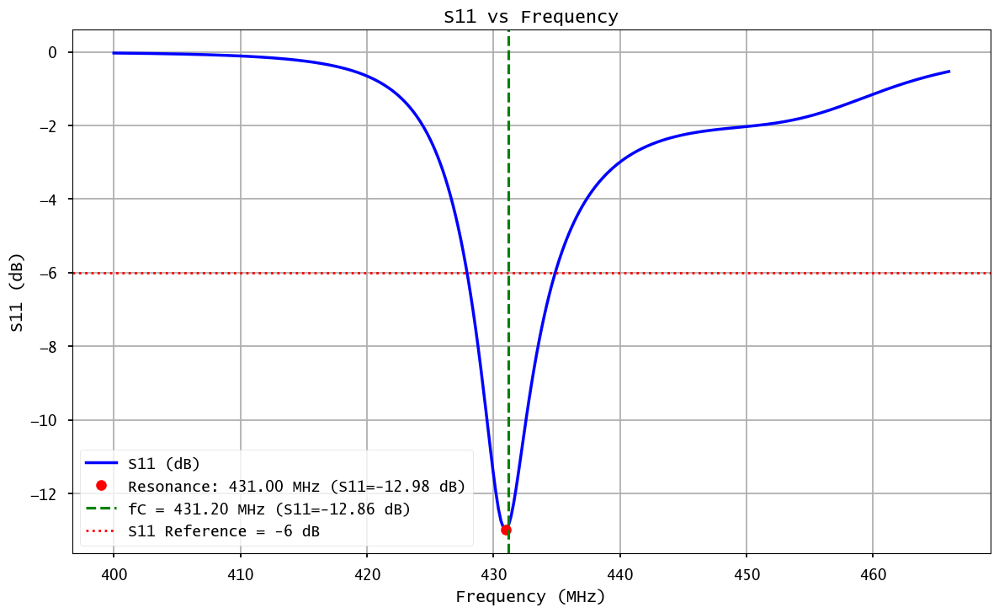


🔹 Bandwidth: 6.80 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 15                                                                   
L = 1.41 nH, C = 96.62 pF


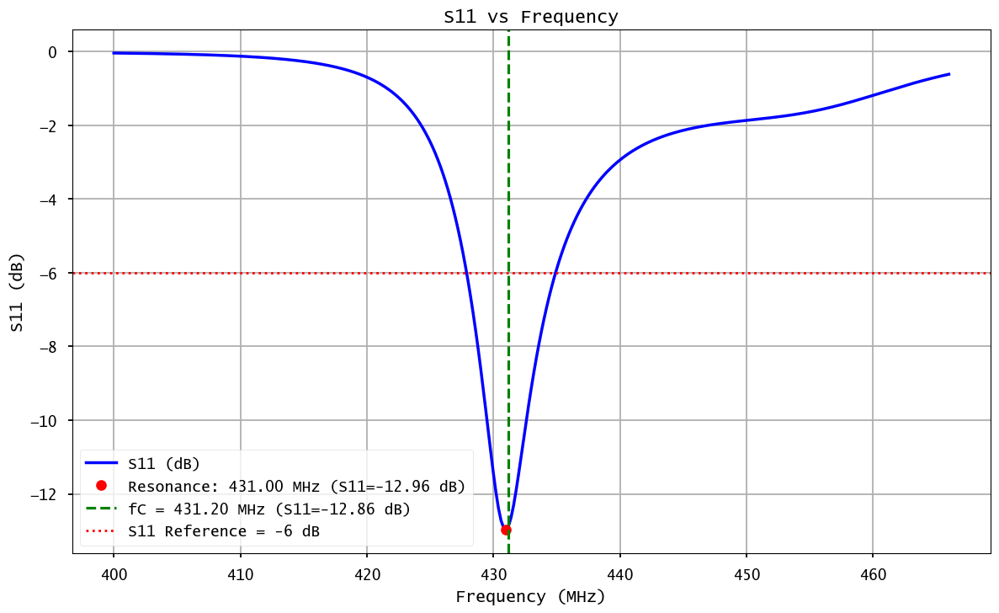


🔹 Bandwidth: 6.80 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 16                                                                   
L = 1.51 nH, C = 90.22 pF


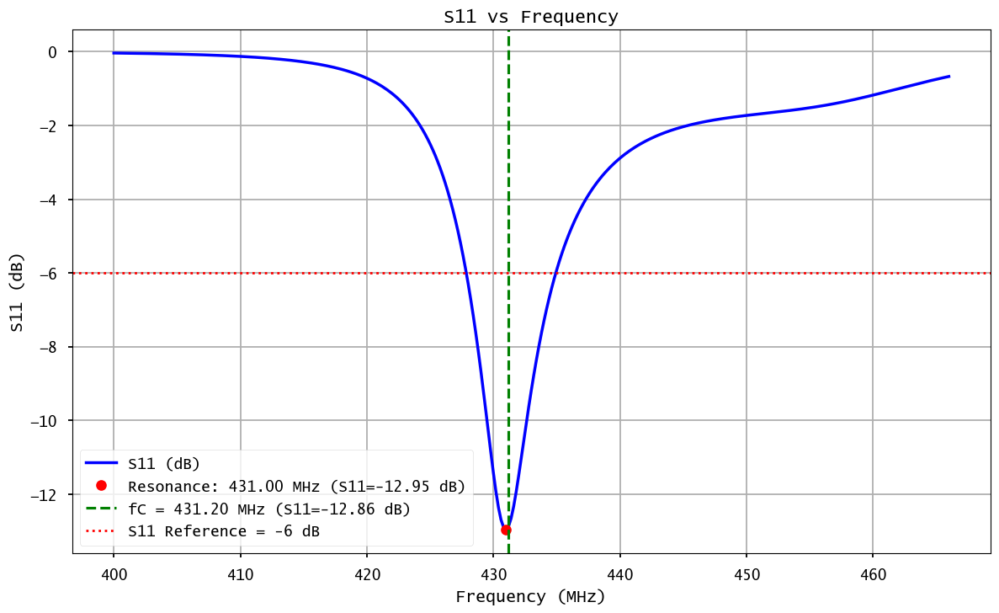


🔹 Bandwidth: 6.80 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 17                                                                   
L = 1.61 nH, C = 84.62 pF


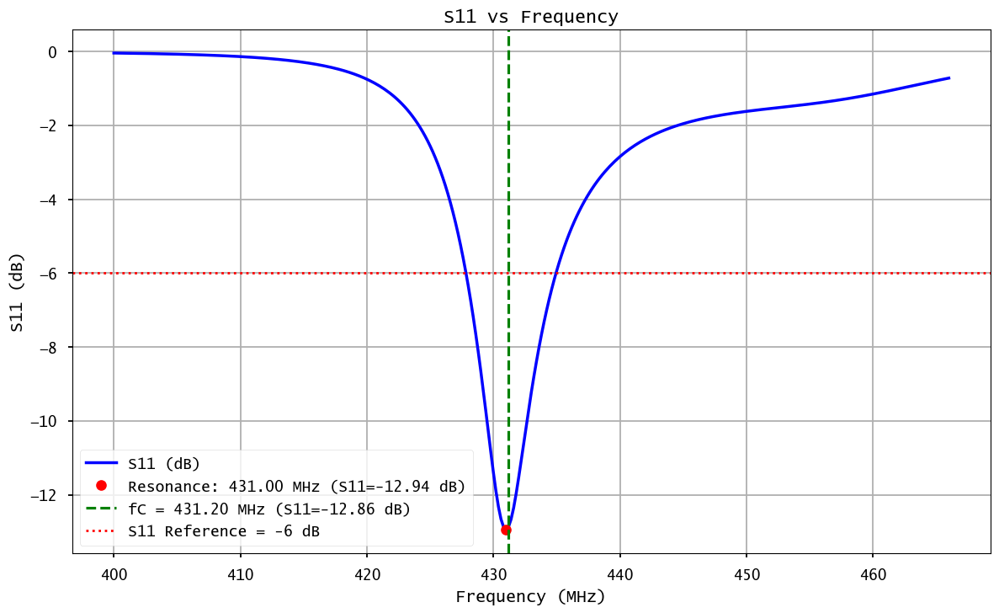


🔹 Bandwidth: 6.80 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 18                                                                   
L = 1.71 nH, C = 79.67 pF


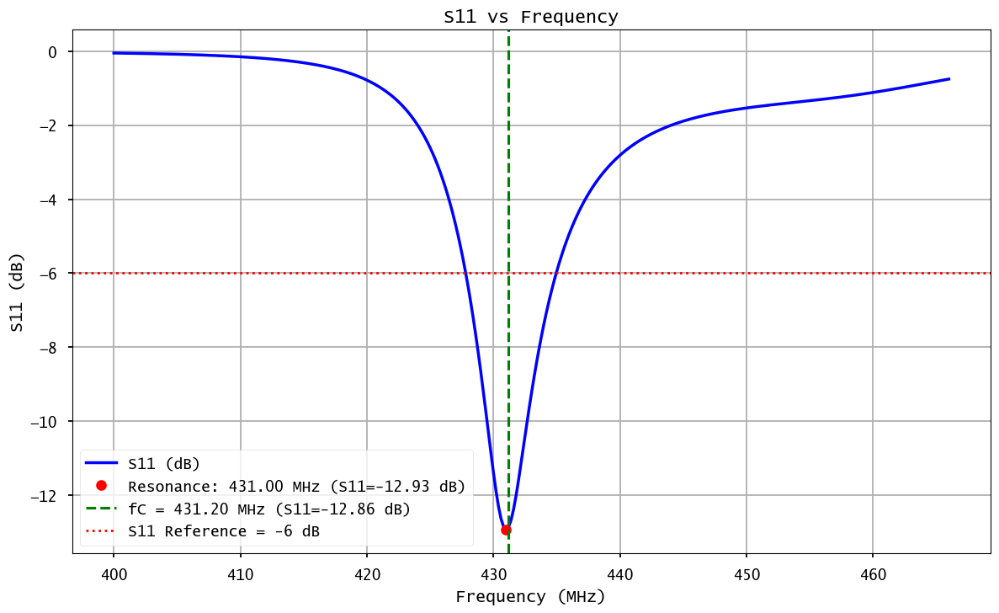


🔹 Bandwidth: 6.80 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 19                                                                   
L = 1.81 nH, C = 75.27 pF


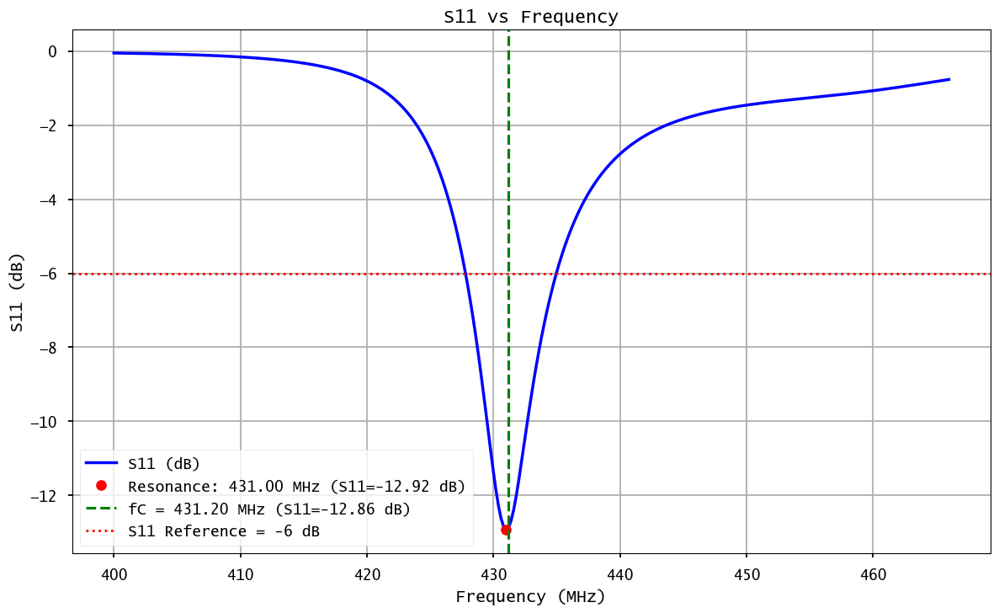


🔹 Bandwidth: 7.00 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 20                                                                   
L = 1.91 nH, C = 71.33 pF


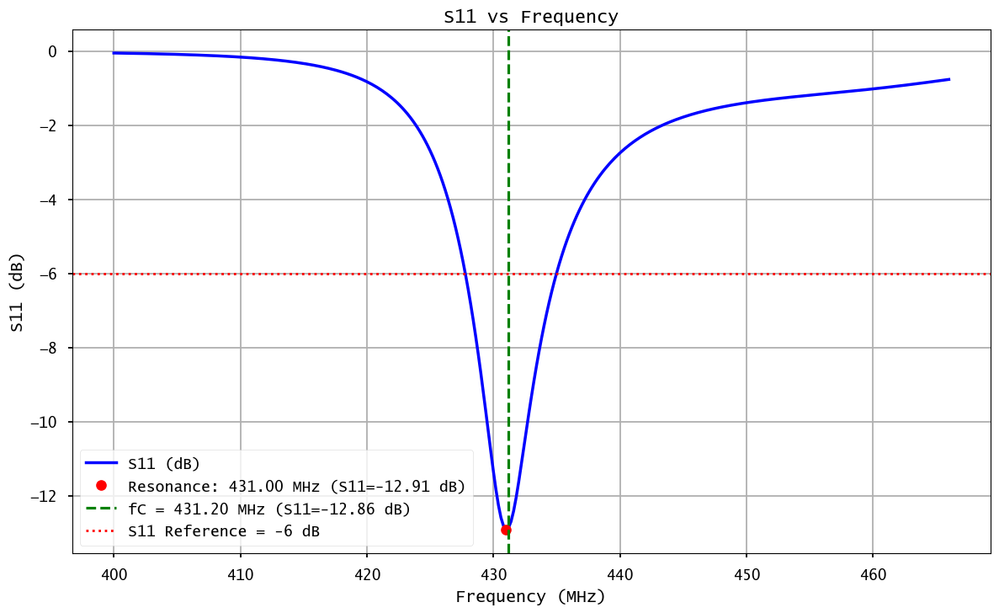


🔹 Bandwidth: 7.00 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 21                                                                   
L = 2.01 nH, C = 67.78 pF


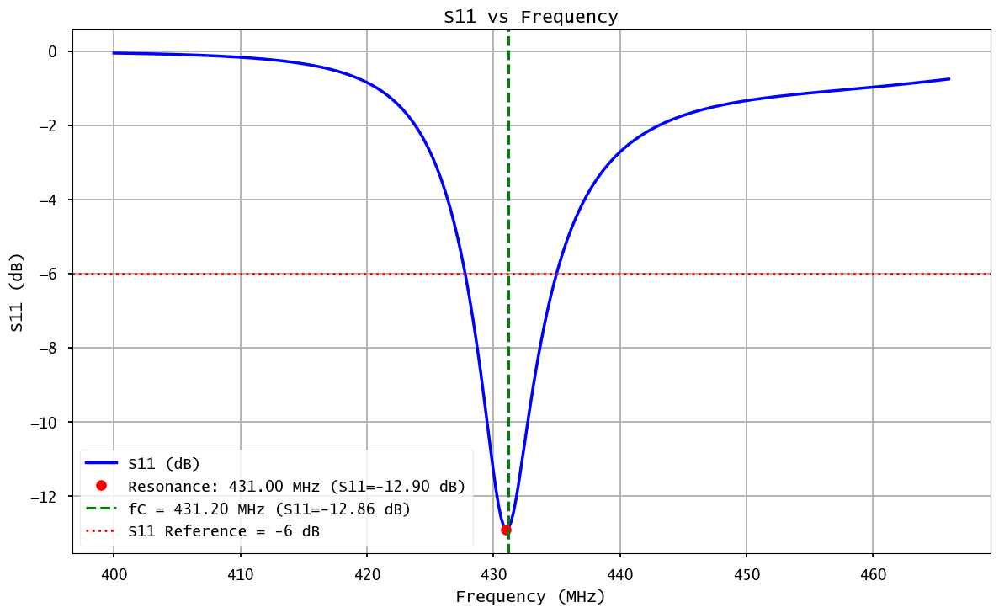


🔹 Bandwidth: 7.00 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 22                                                                   
L = 2.11 nH, C = 64.57 pF


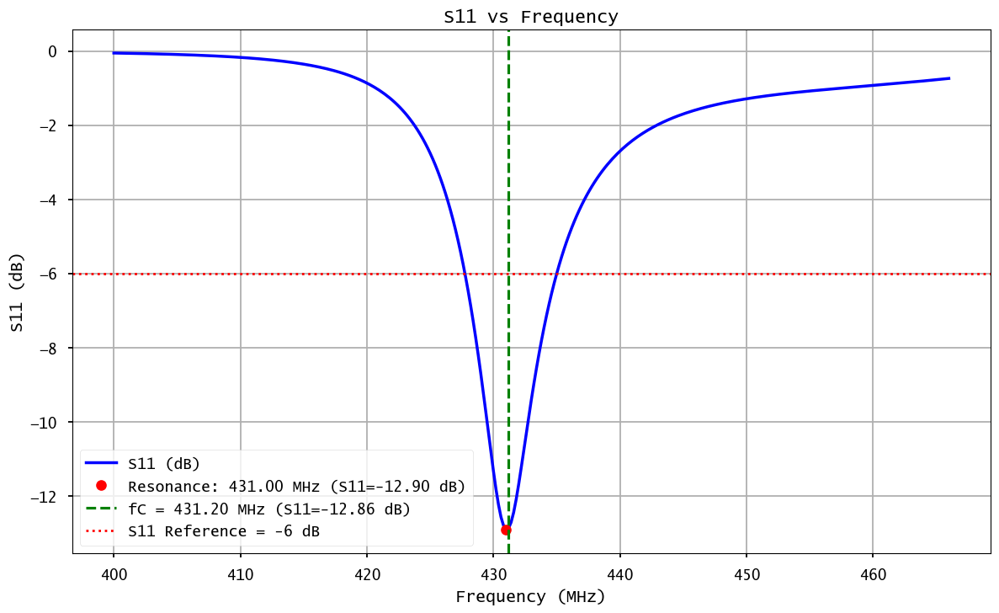


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 23                                                                   
L = 2.21 nH, C = 61.64 pF


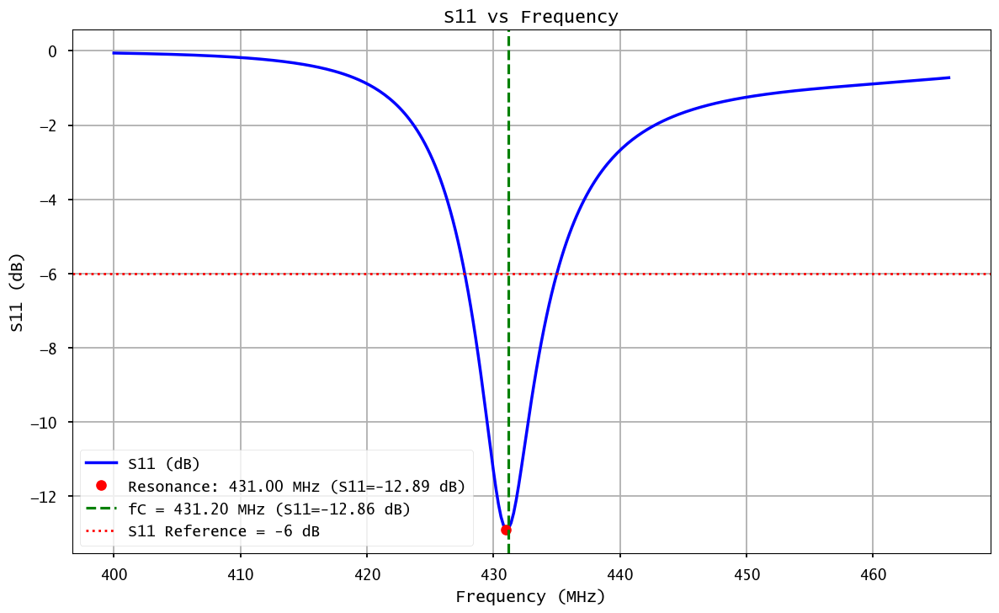


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 24                                                                   
L = 2.31 nH, C = 58.98 pF


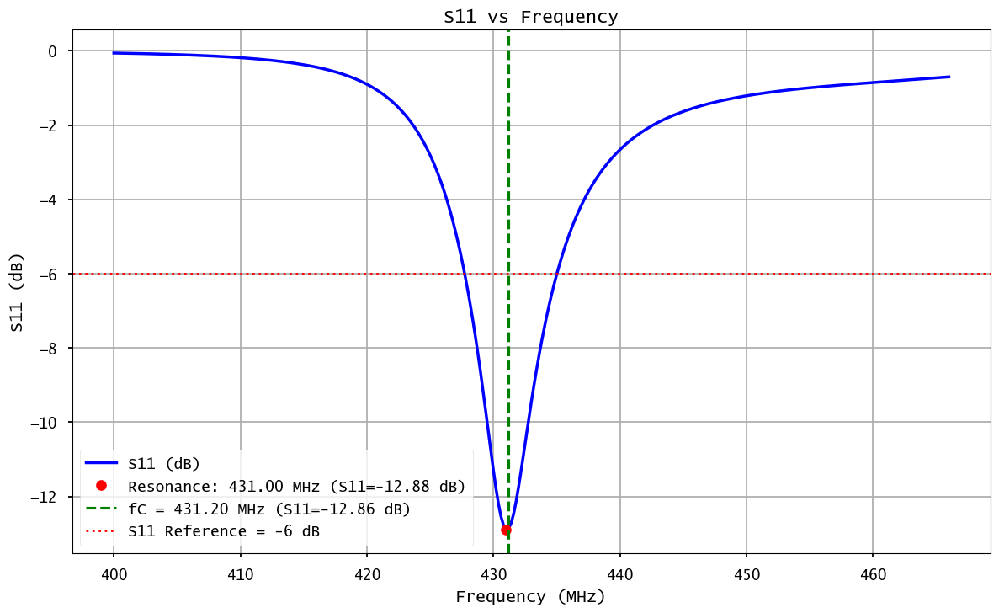


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 25                                                                   
L = 2.41 nH, C = 56.53 pF


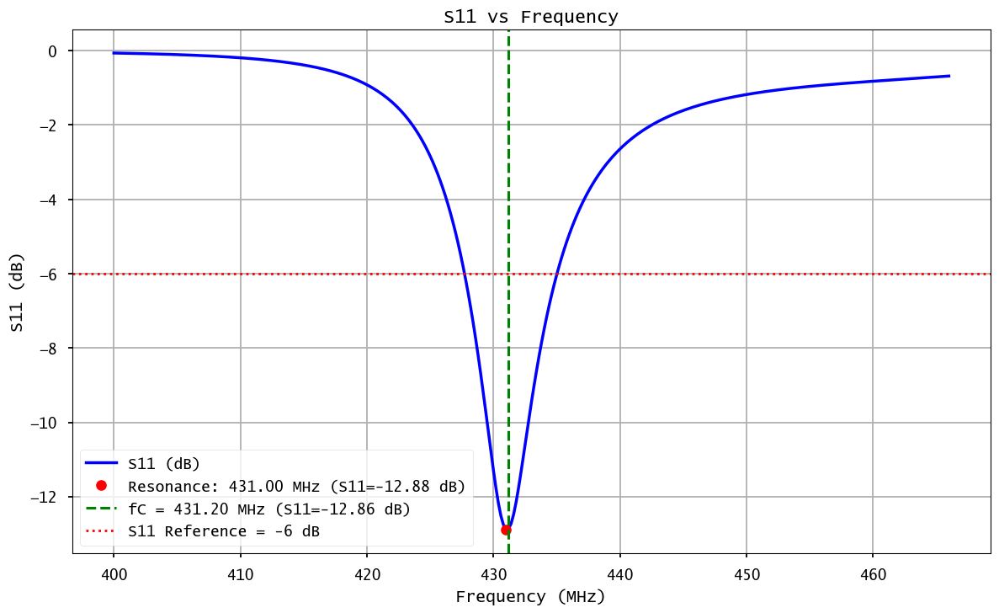


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 26                                                                   
L = 2.51 nH, C = 54.28 pF


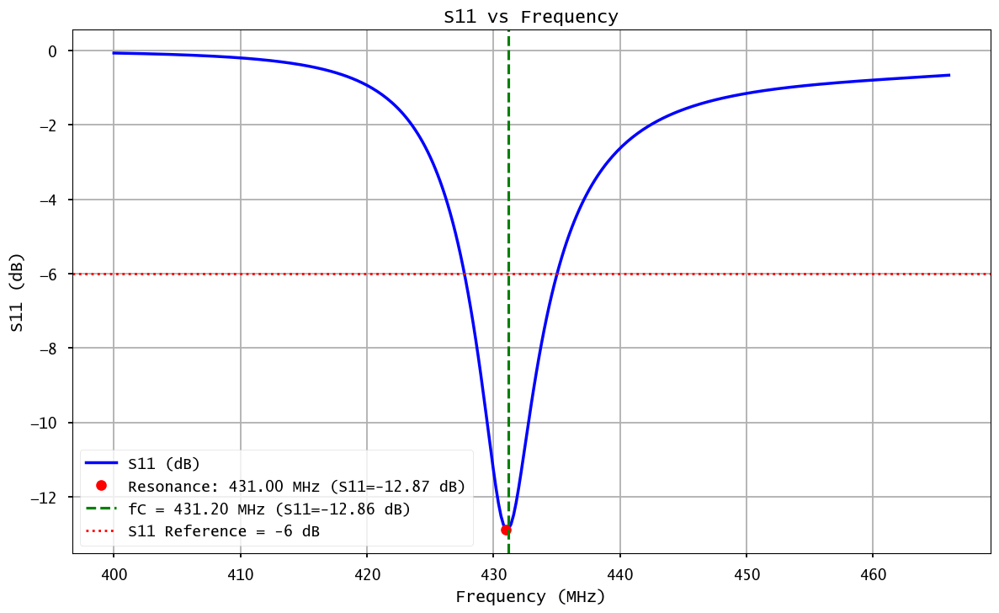


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 27                                                                   
L = 2.61 nH, C = 52.20 pF


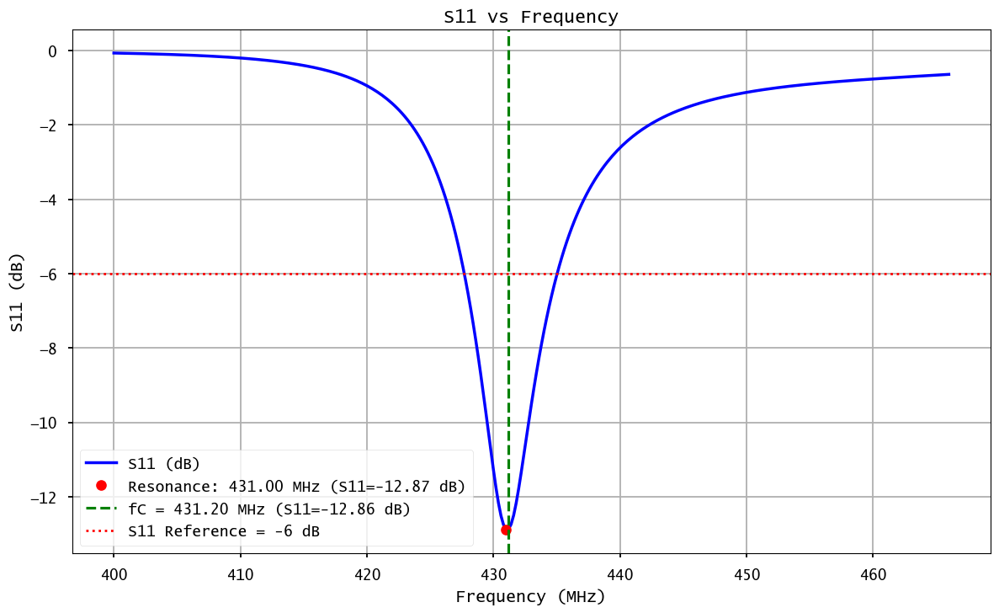


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 28                                                                   
L = 2.71 nH, C = 50.27 pF


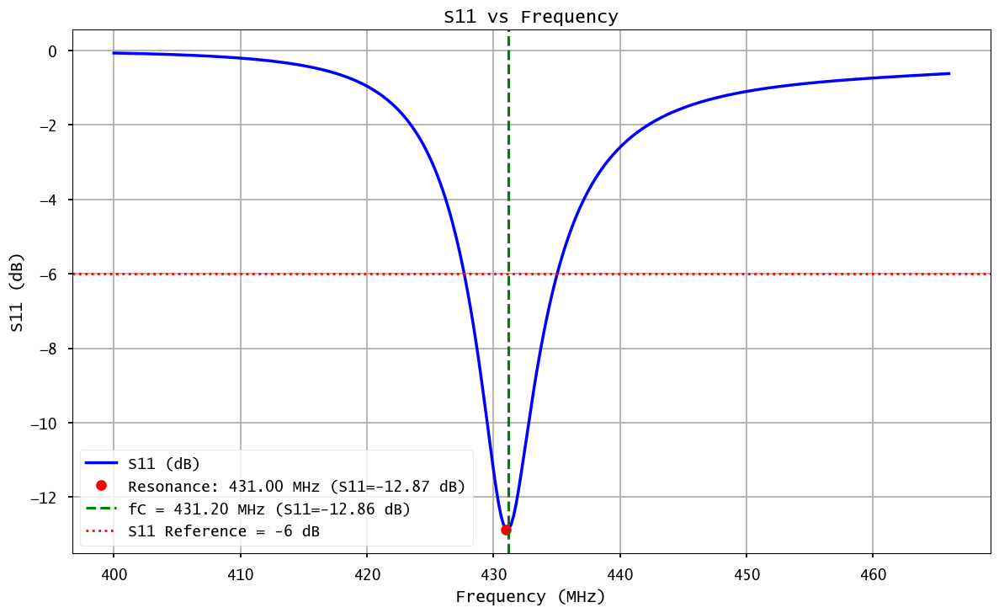


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 29                                                                   
L = 2.81 nH, C = 48.48 pF


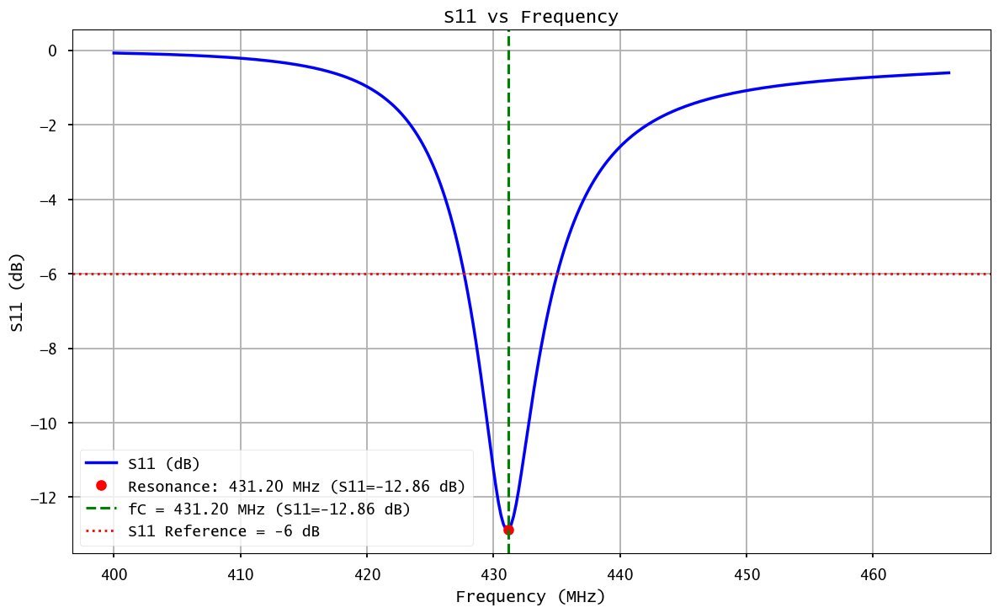


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 30                                                                   
L = 2.91 nH, C = 46.82 pF


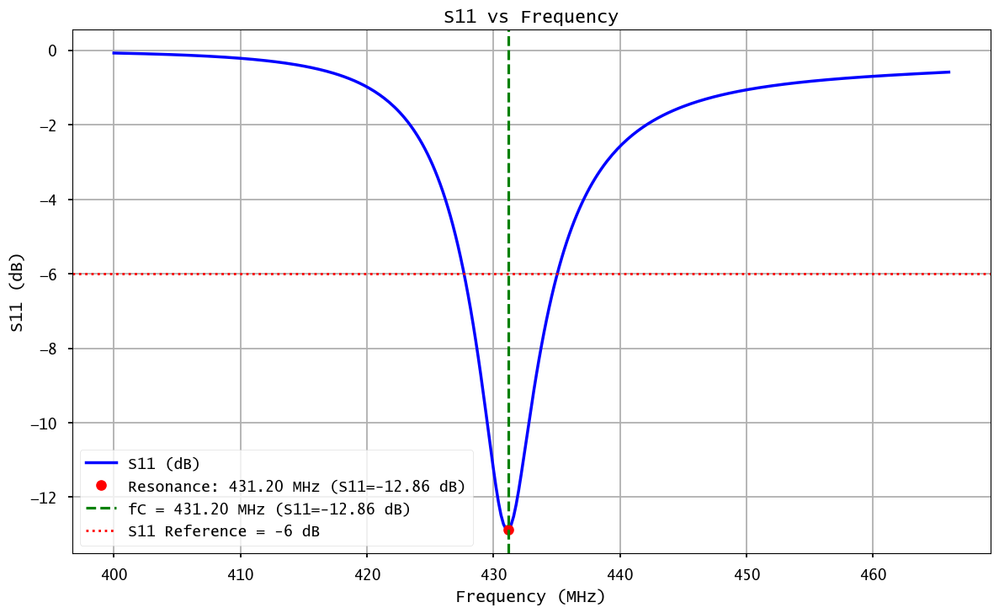


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 31                                                                   
L = 3.01 nH, C = 45.26 pF


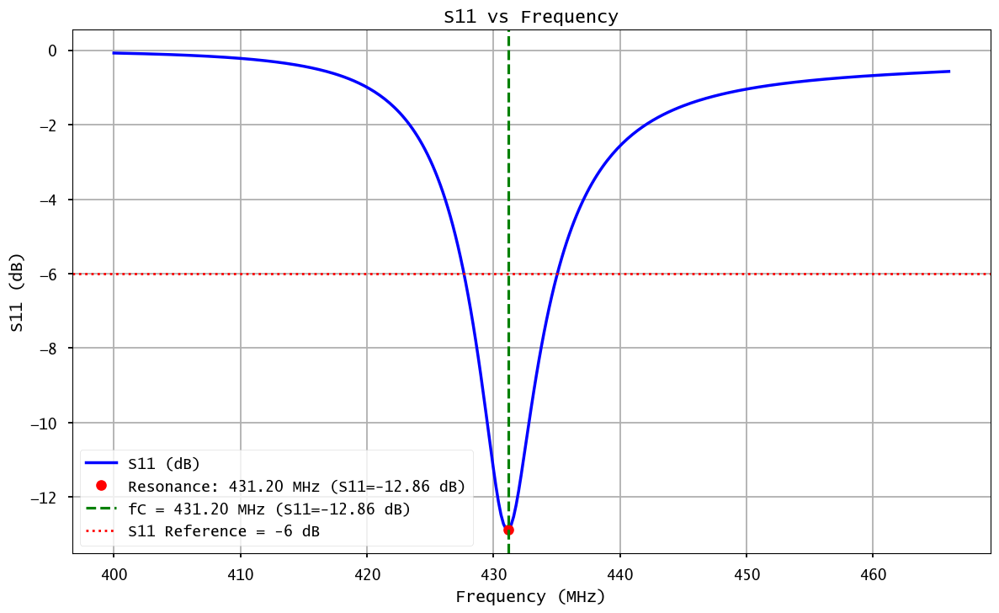


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 32                                                                   
L = 3.11 nH, C = 43.80 pF


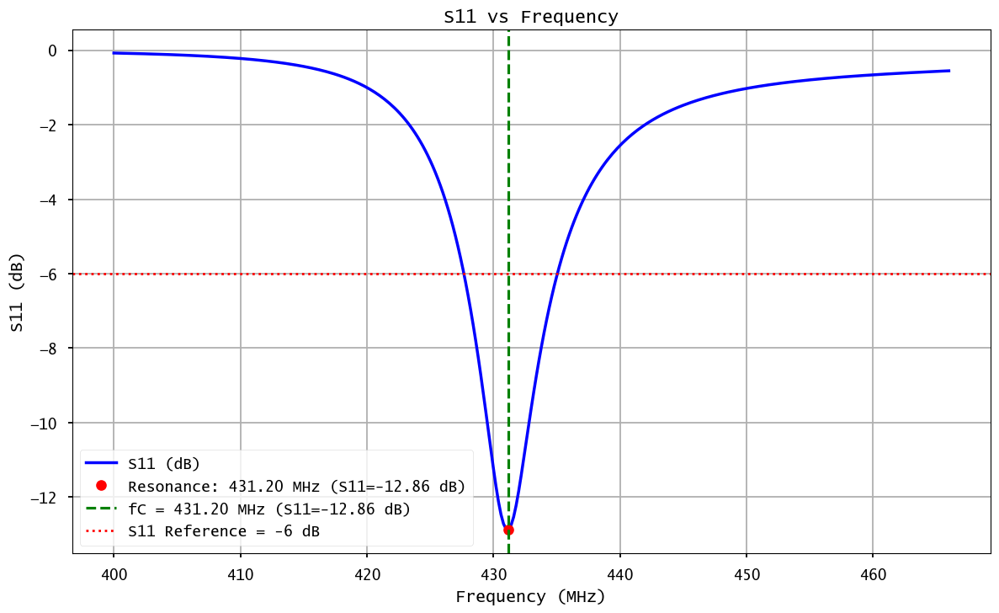


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 33                                                                   
L = 3.21 nH, C = 42.44 pF


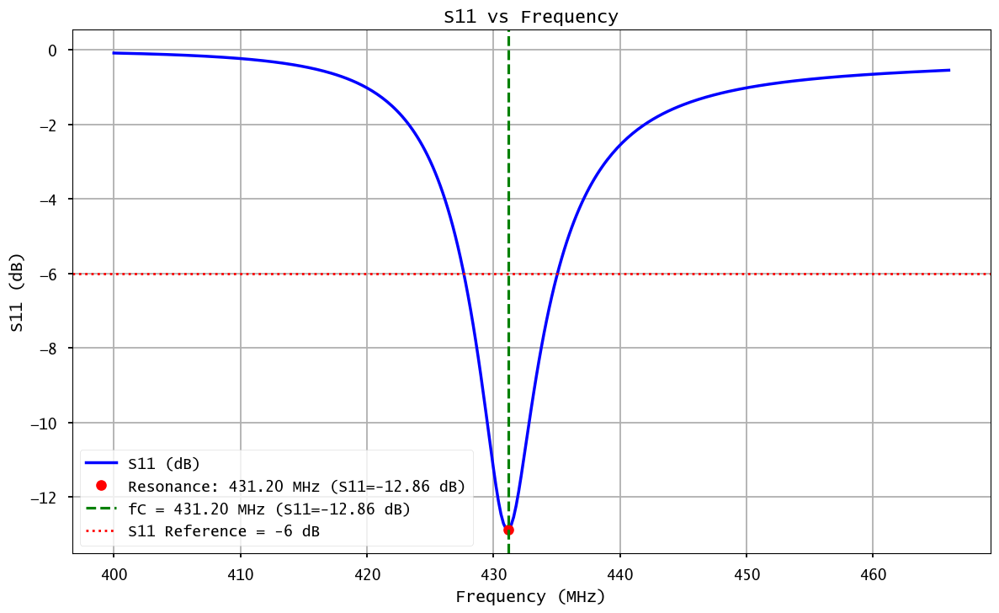


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 34                                                                   
L = 3.31 nH, C = 41.16 pF


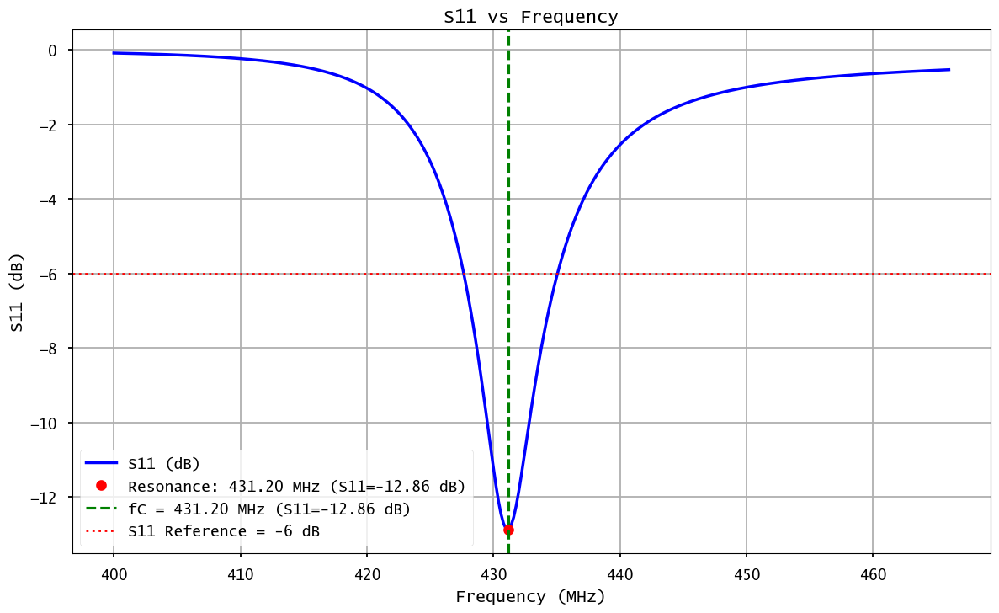


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 35                                                                   
L = 3.41 nH, C = 39.95 pF


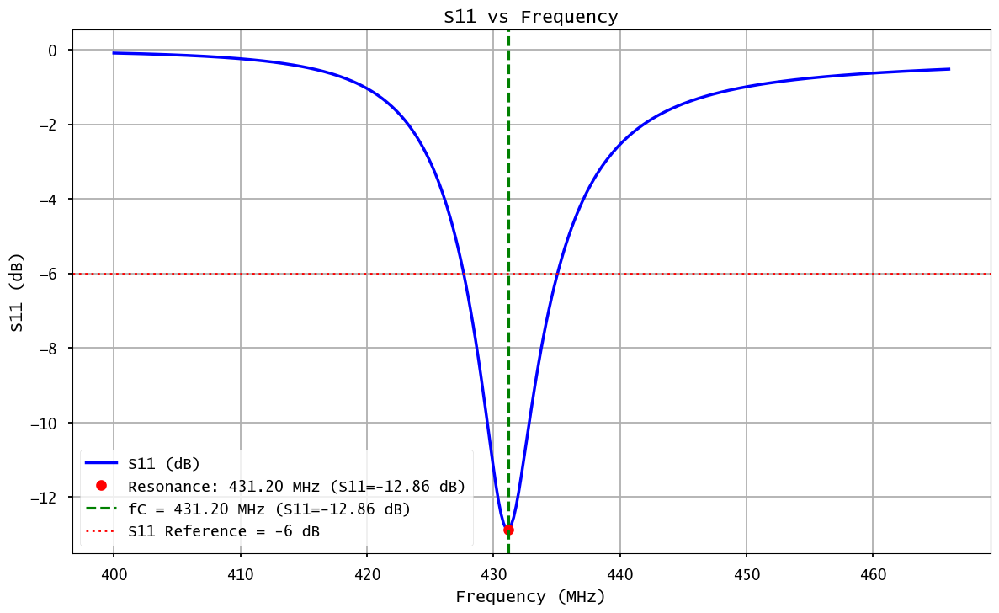


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 36                                                                   
L = 3.51 nH, C = 38.81 pF


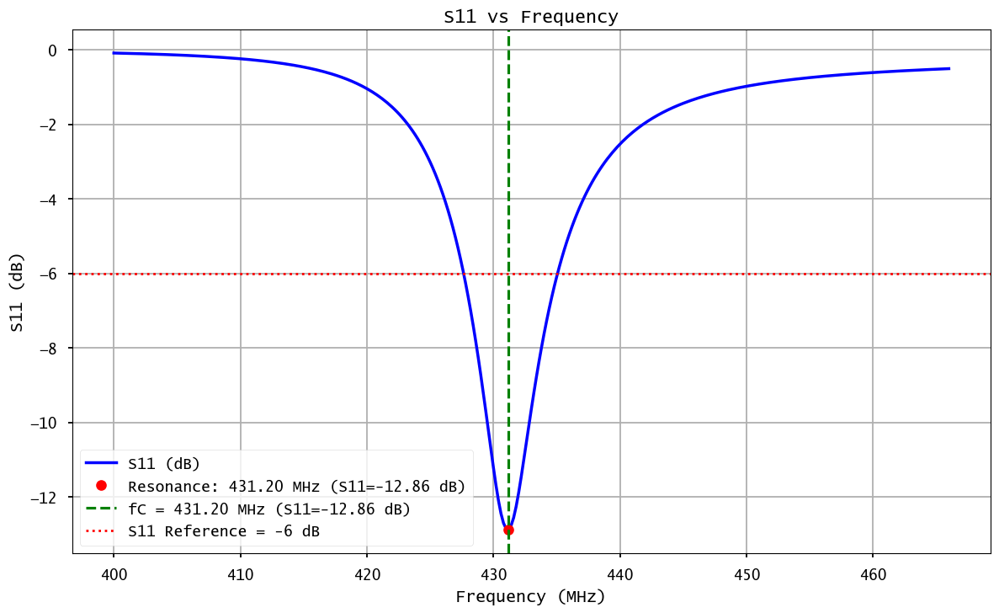


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 37                                                                   
L = 3.61 nH, C = 37.74 pF


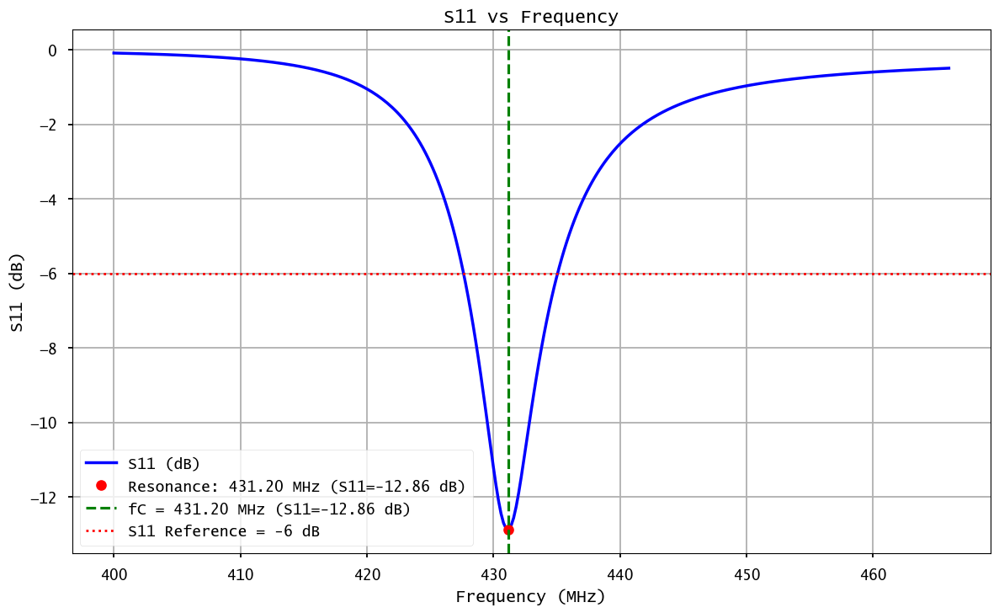


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 38                                                                   
L = 3.71 nH, C = 36.72 pF


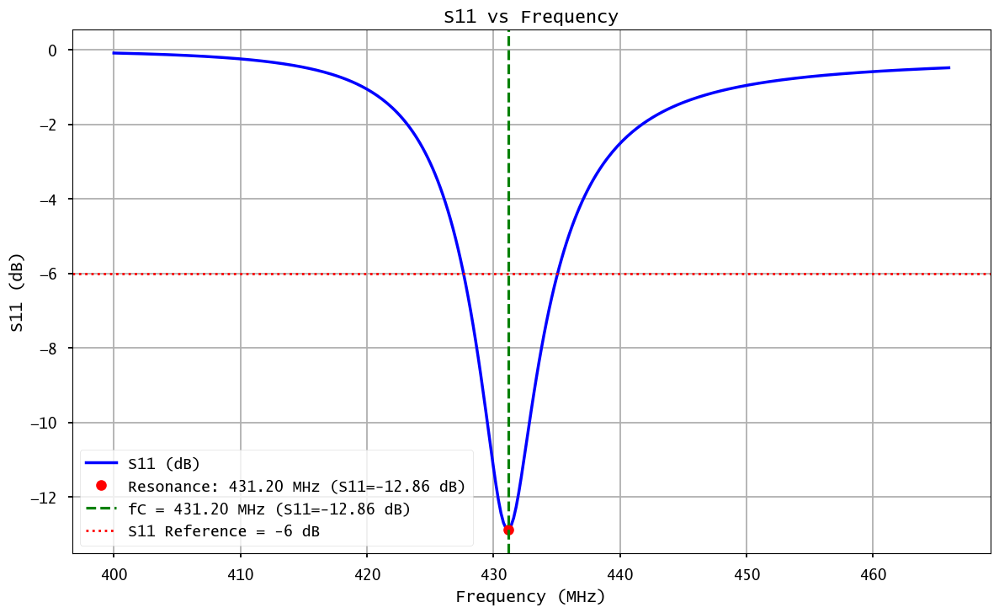


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 39                                                                   
L = 3.81 nH, C = 35.76 pF


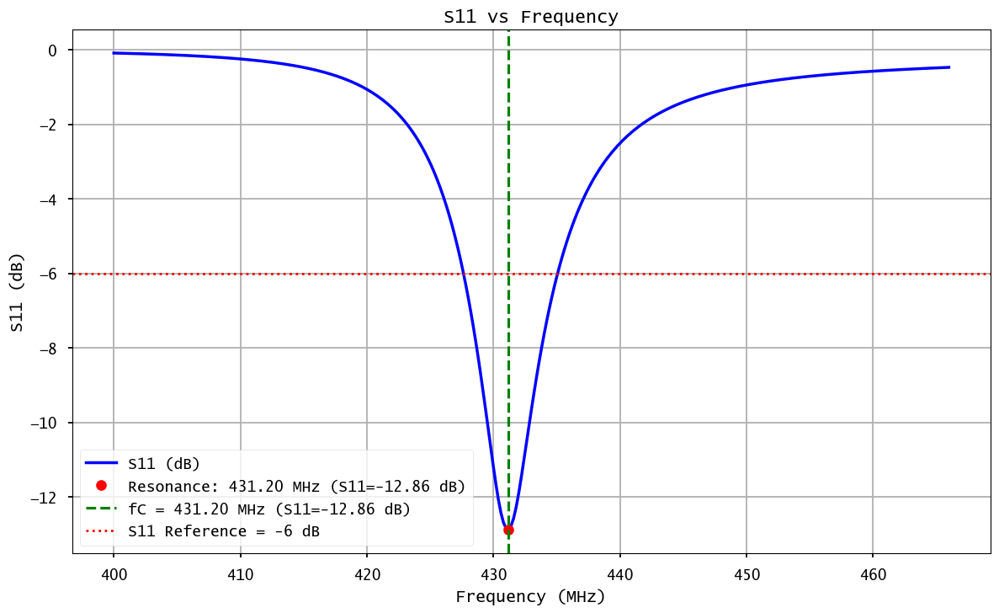


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 40                                                                   
L = 3.91 nH, C = 34.84 pF


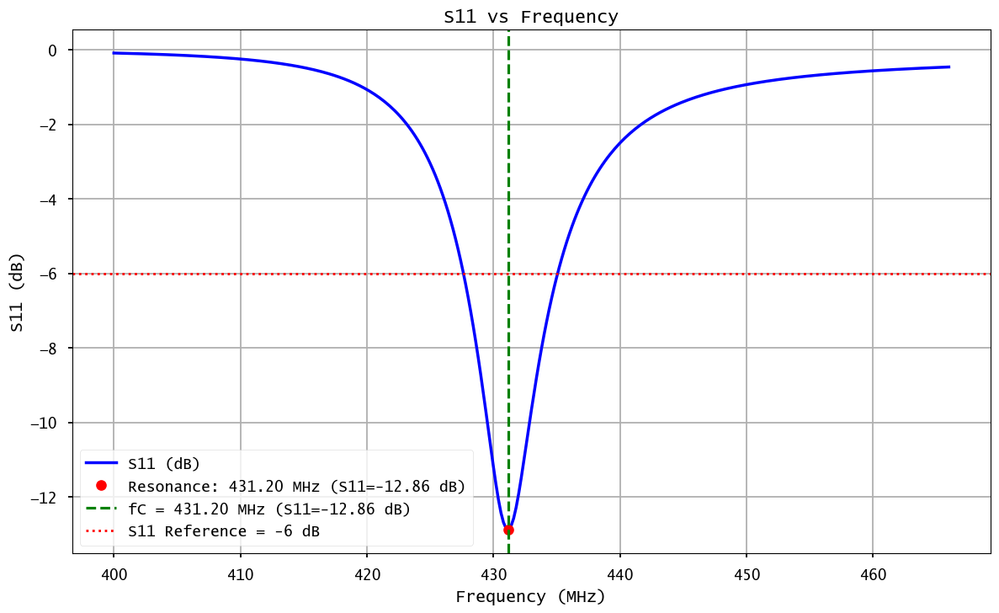


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 41                                                                   
L = 4.01 nH, C = 33.97 pF


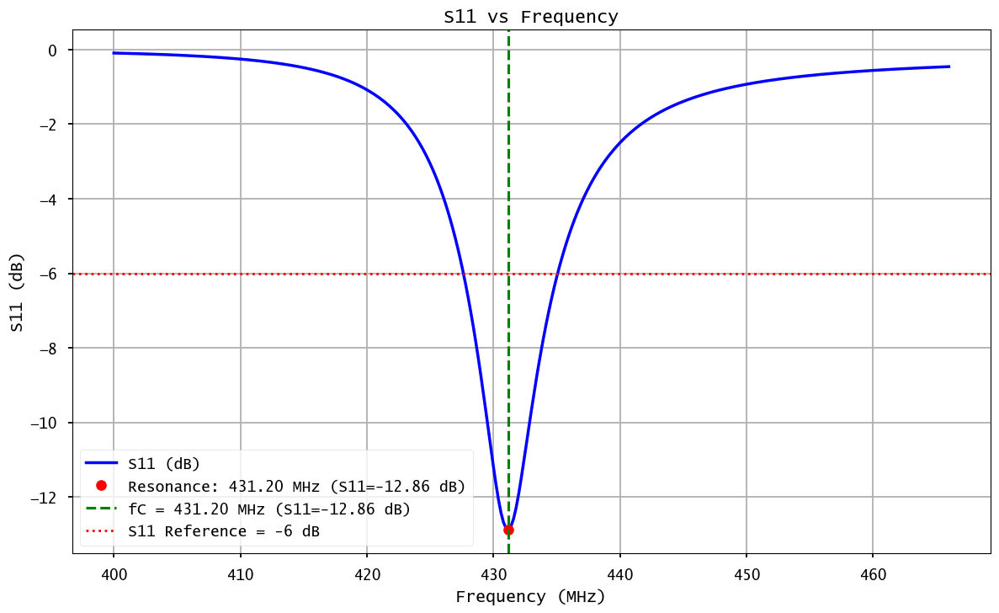


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 42                                                                   
L = 4.11 nH, C = 33.15 pF


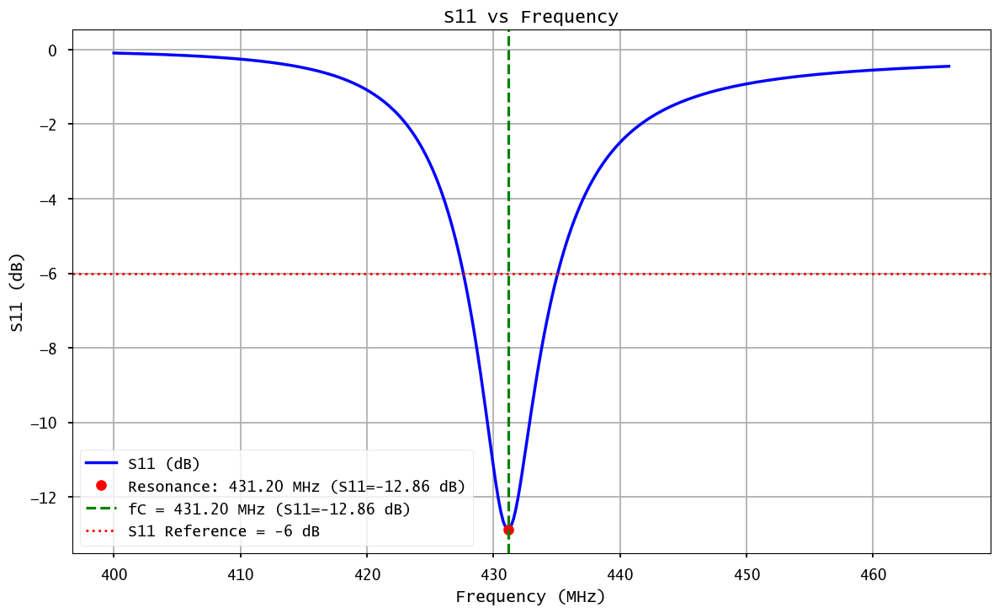


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 43                                                                   
L = 4.21 nH, C = 32.36 pF


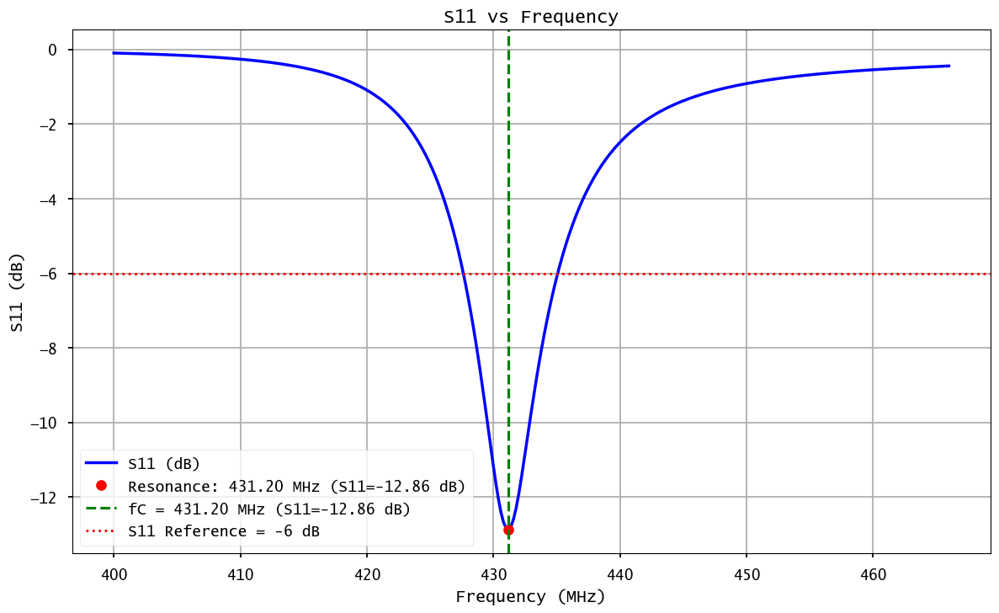


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 44                                                                   
L = 4.31 nH, C = 31.61 pF


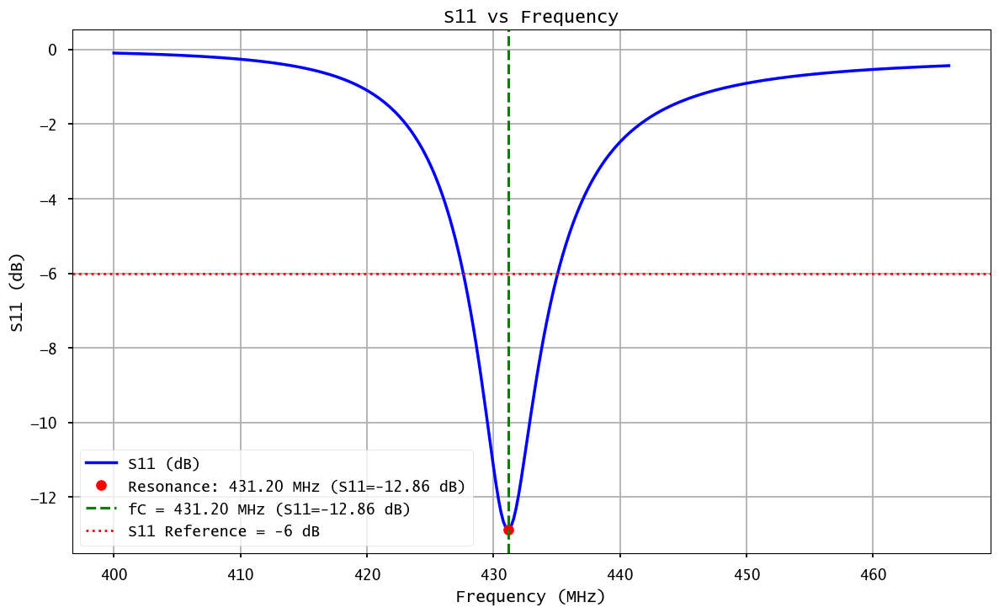


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 45                                                                   
L = 4.41 nH, C = 30.89 pF


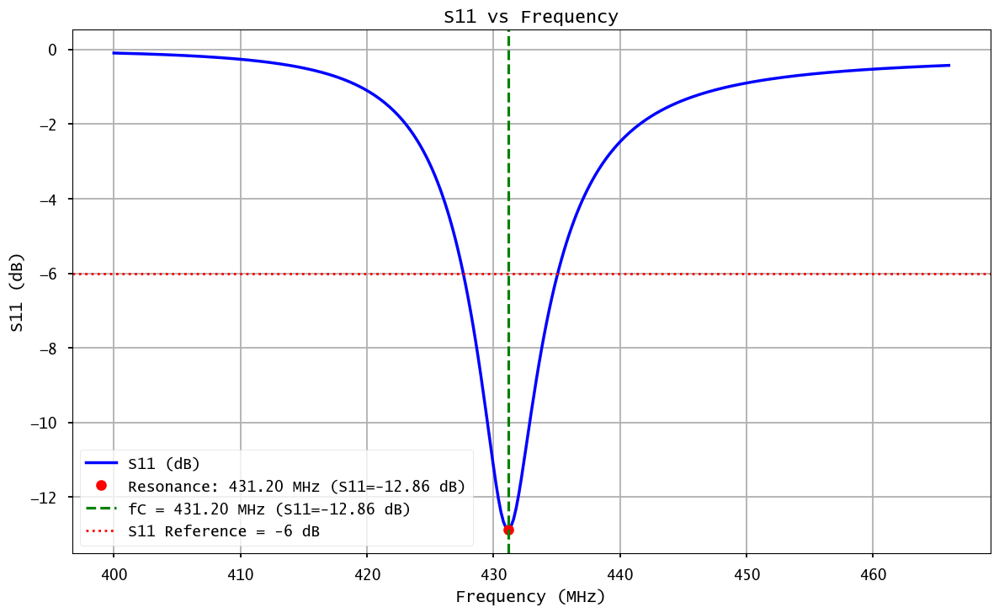


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 46                                                                   
L = 4.51 nH, C = 30.21 pF


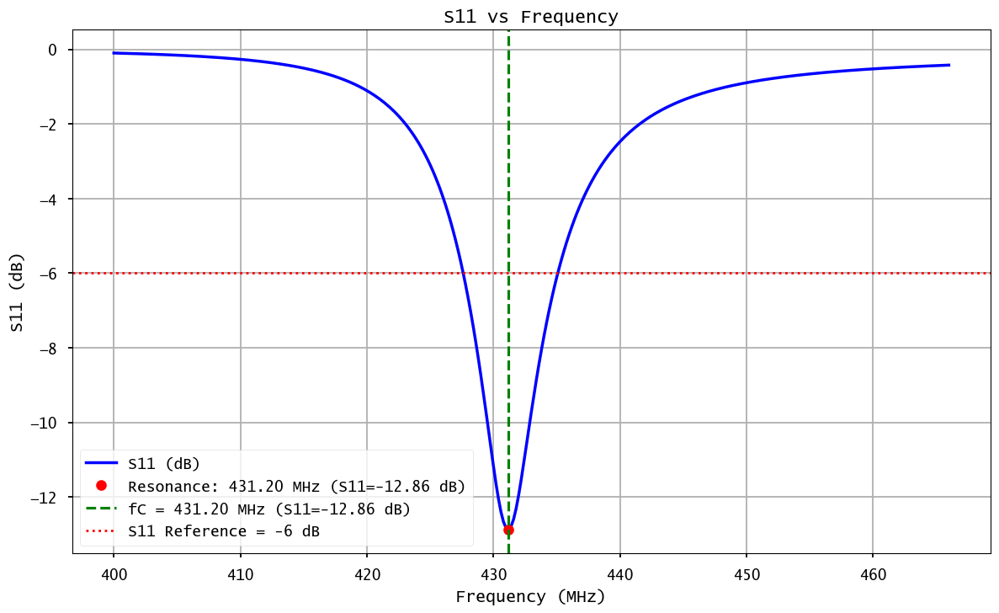


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 47                                                                   
L = 4.61 nH, C = 29.55 pF


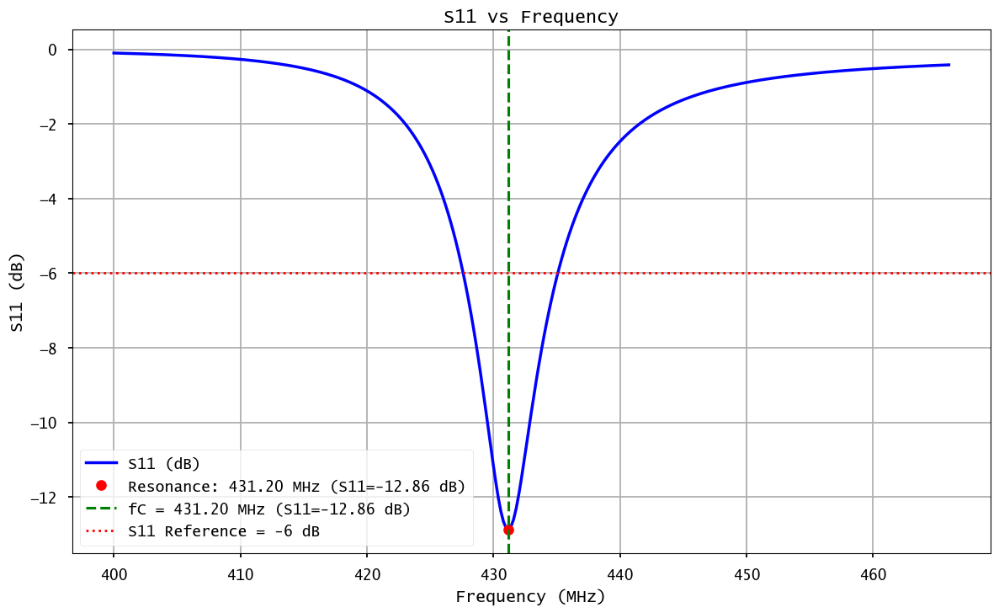


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 48                                                                   
L = 4.71 nH, C = 28.92 pF


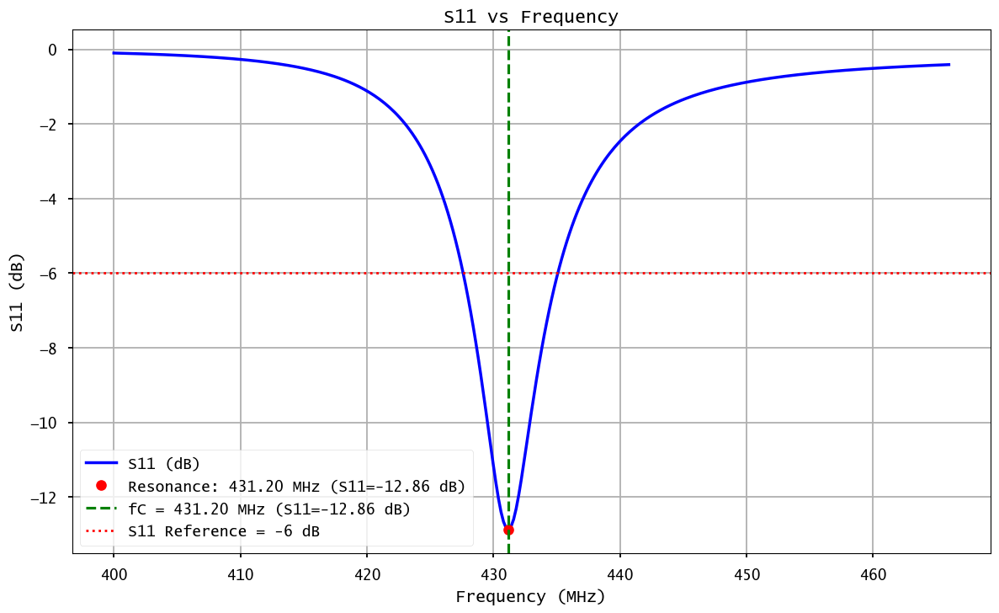


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 49                                                                   
L = 4.81 nH, C = 28.32 pF


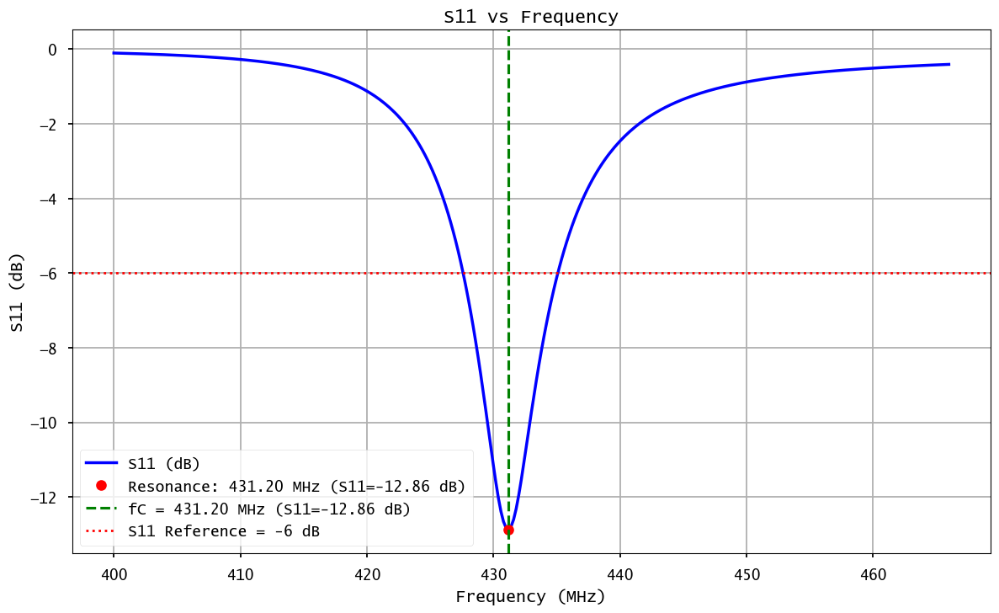


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 50                                                                   
L = 4.91 nH, C = 27.75 pF


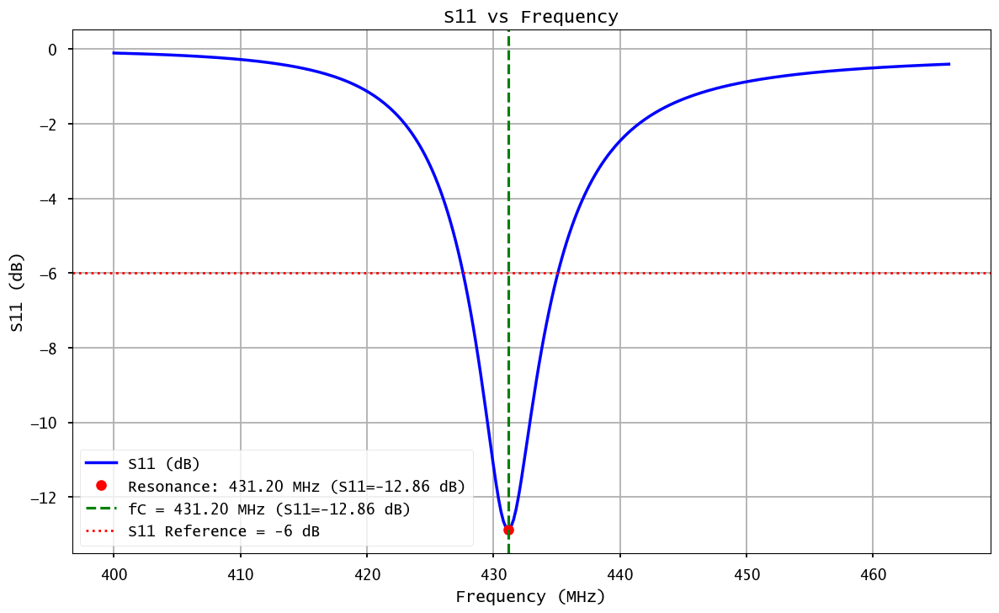


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 51                                                                   
L = 5.01 nH, C = 27.19 pF


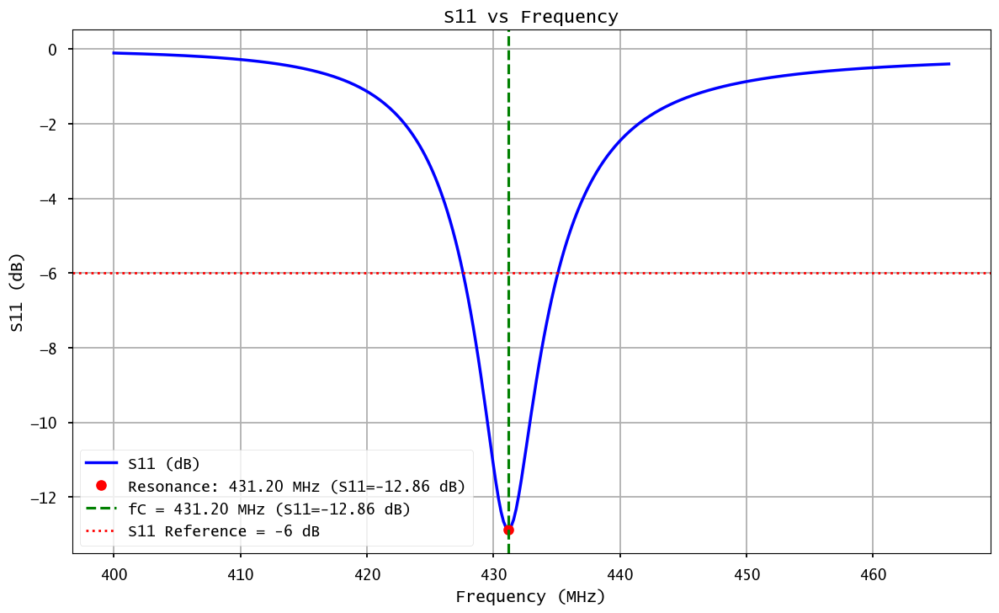


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 52                                                                   
L = 5.11 nH, C = 26.66 pF


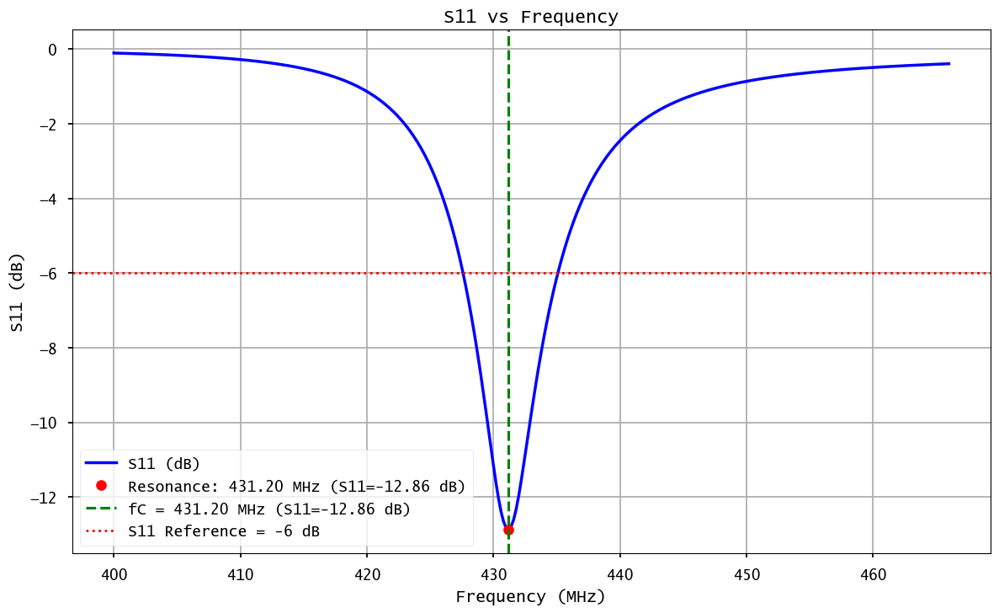


🔹 Bandwidth: 7.20 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 53                                                                   
L = 5.21 nH, C = 26.15 pF


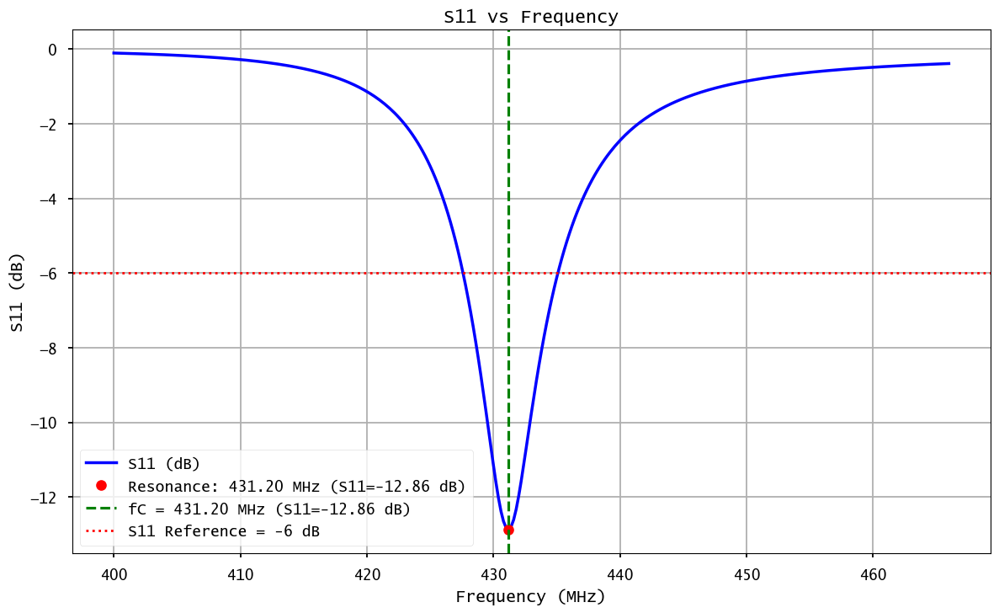


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 54                                                                   
L = 5.31 nH, C = 25.66 pF


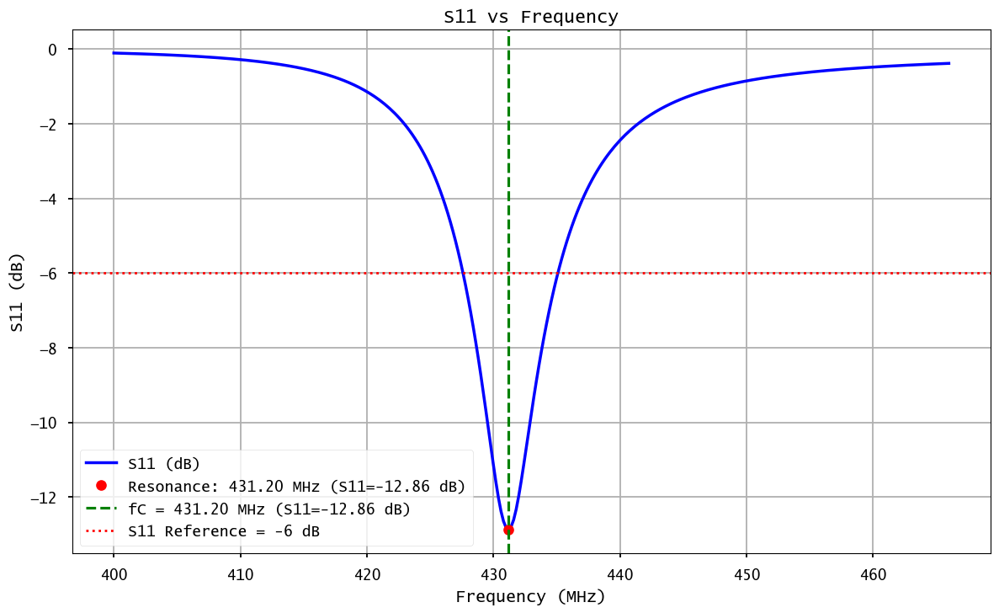


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 55                                                                   
L = 5.41 nH, C = 25.18 pF


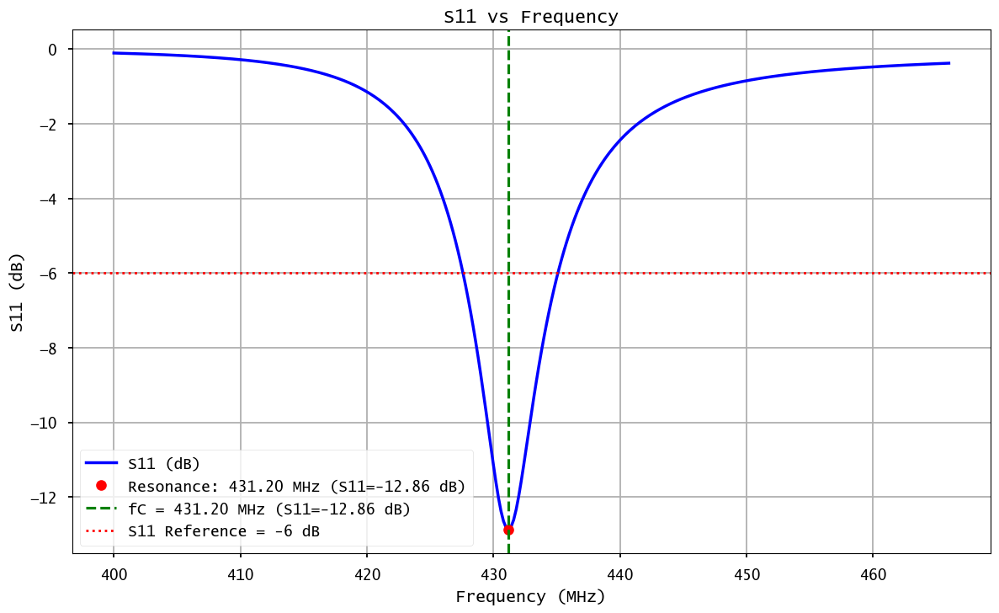


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 56                                                                   
L = 5.51 nH, C = 24.72 pF


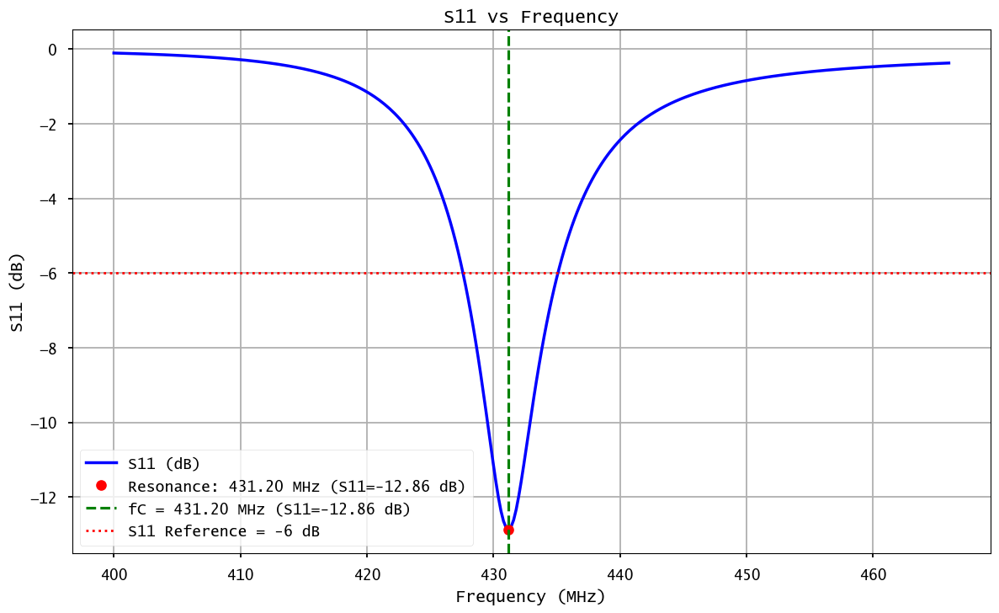


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 57                                                                   
L = 5.61 nH, C = 24.28 pF


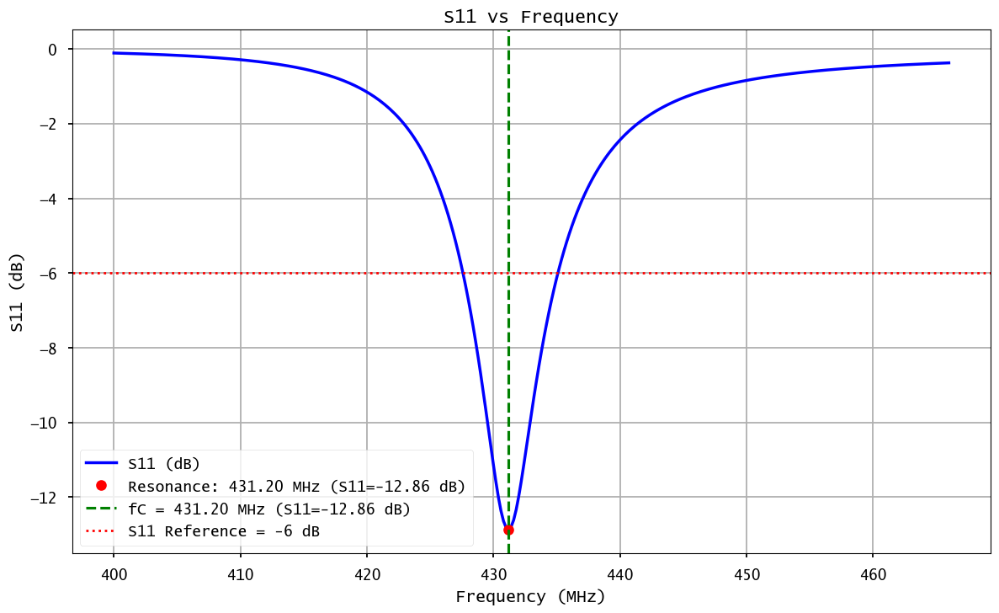


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 58                                                                   
L = 5.71 nH, C = 23.86 pF


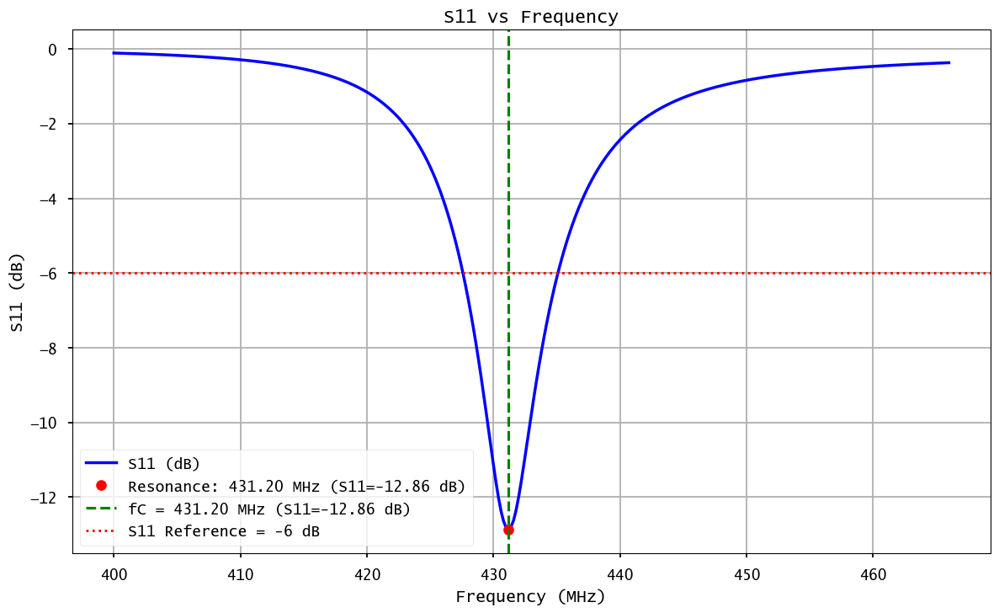


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 59                                                                   
L = 5.81 nH, C = 23.45 pF


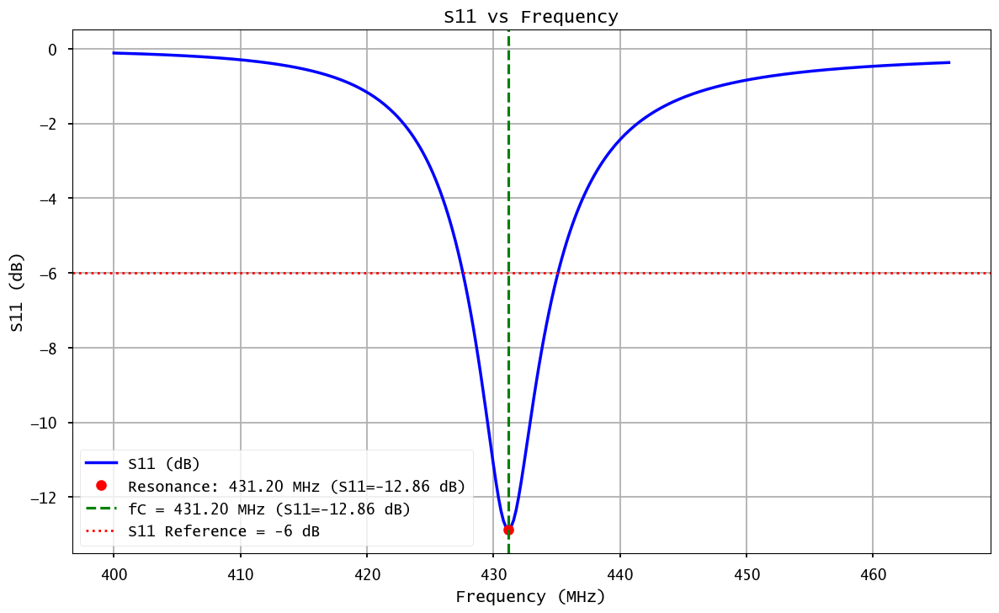


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 60                                                                   
L = 5.91 nH, C = 23.05 pF


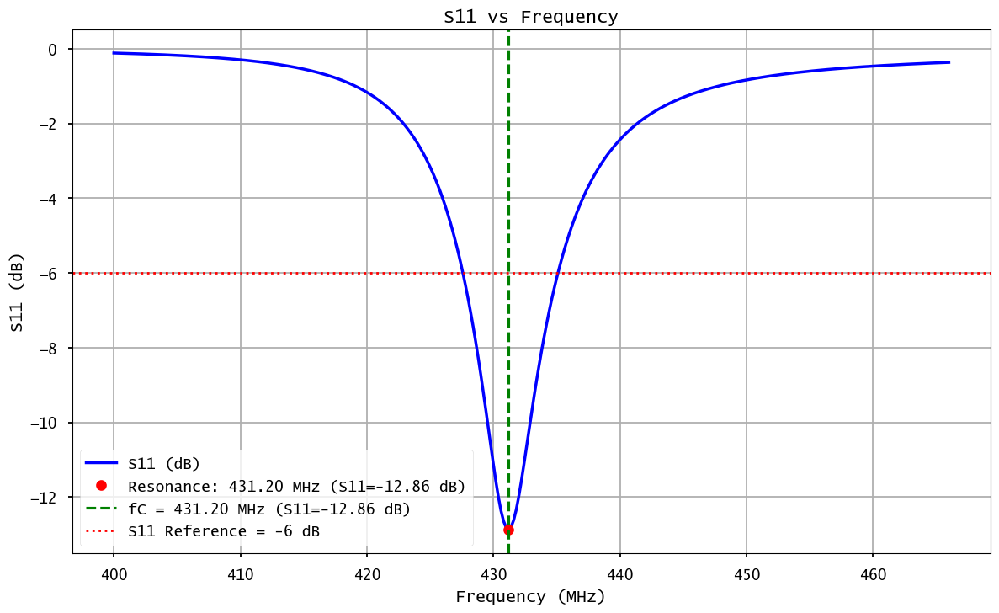


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 61                                                                   
L = 6.01 nH, C = 22.67 pF


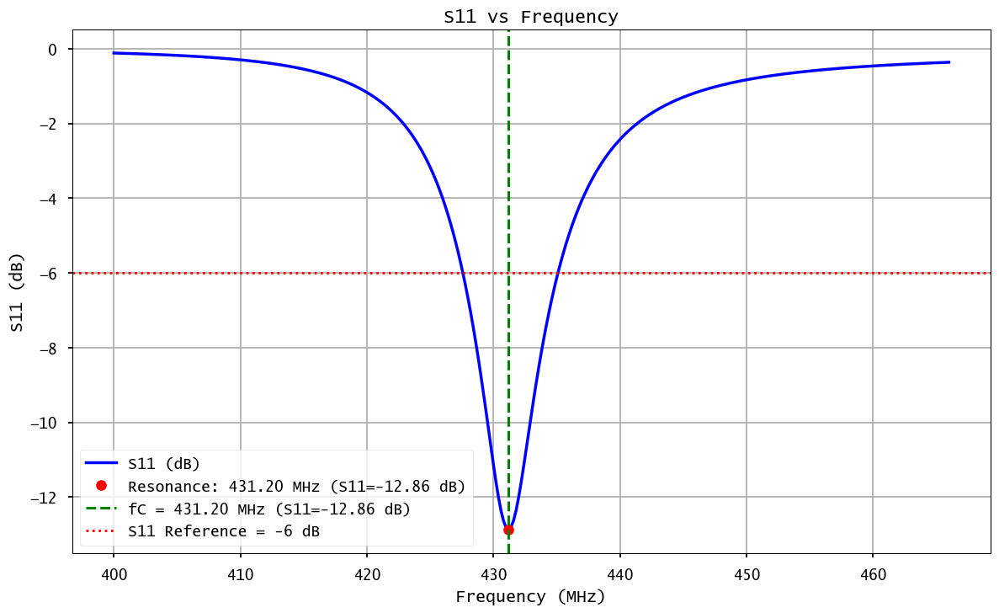


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 62                                                                   
L = 6.11 nH, C = 22.30 pF


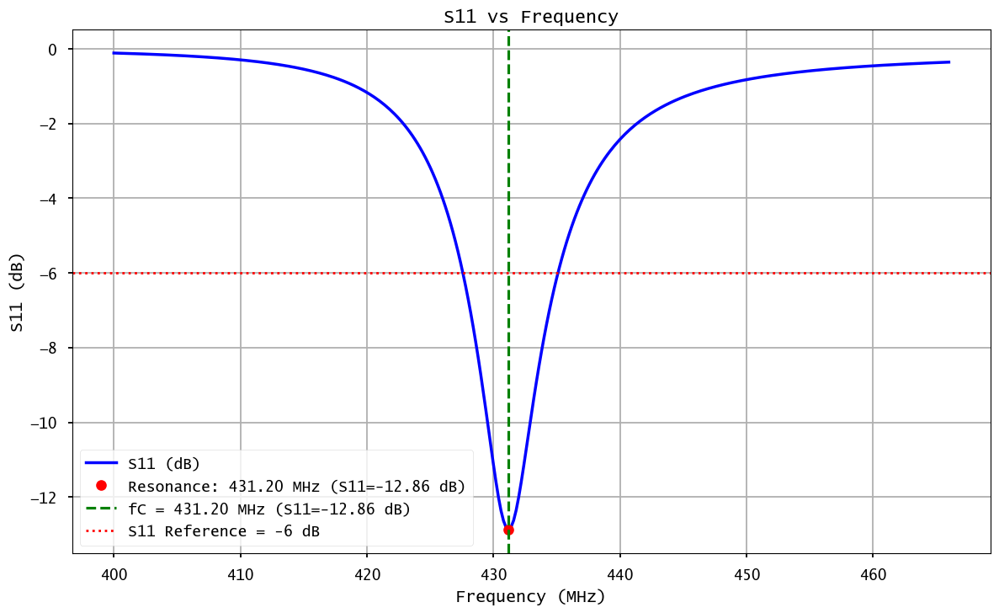


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 63                                                                   
L = 6.21 nH, C = 21.94 pF


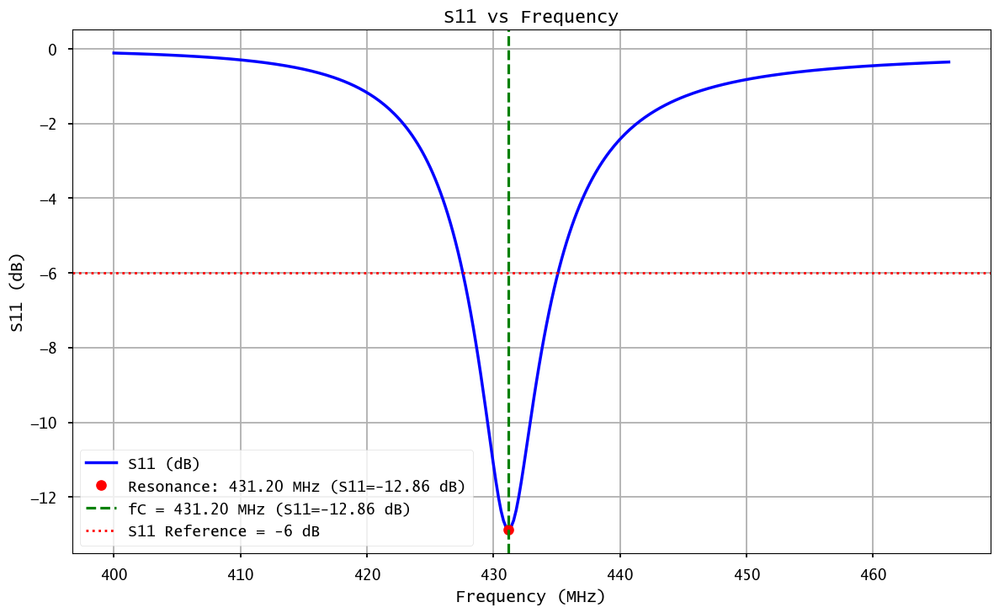


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 64                                                                   
L = 6.31 nH, C = 21.59 pF


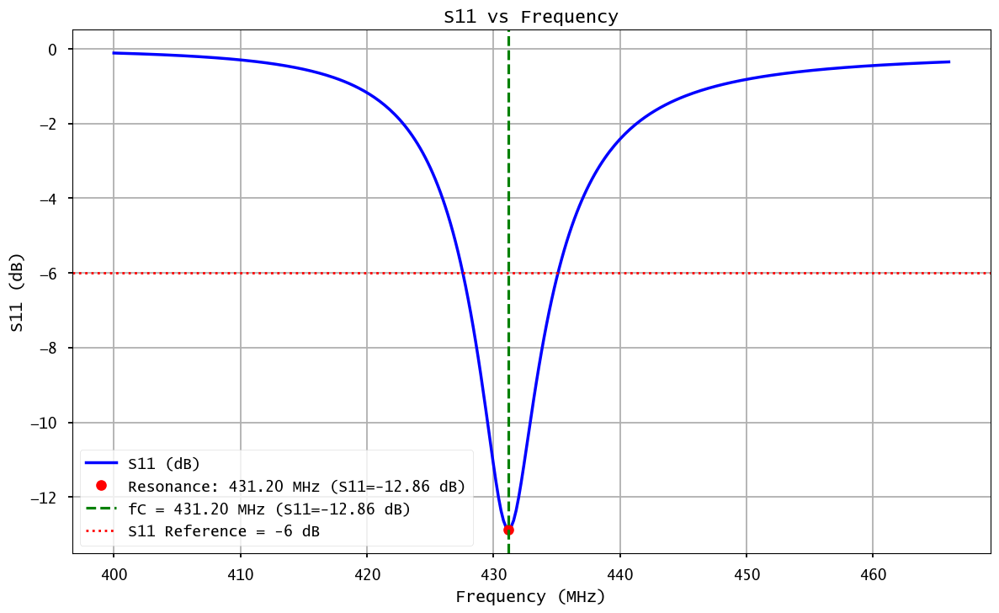


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 65                                                                   
L = 6.41 nH, C = 21.25 pF


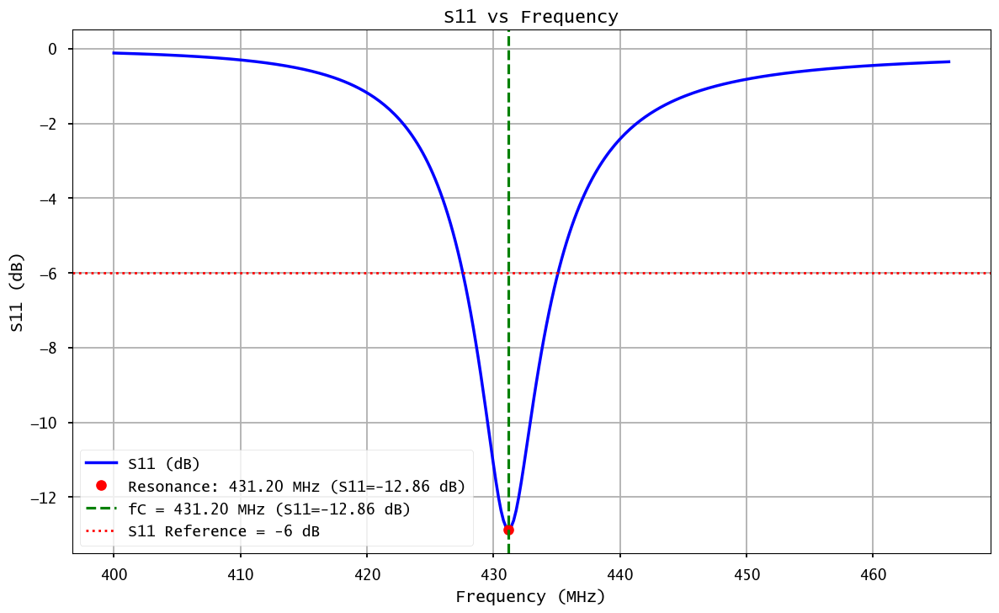


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 66                                                                   
L = 6.51 nH, C = 20.93 pF


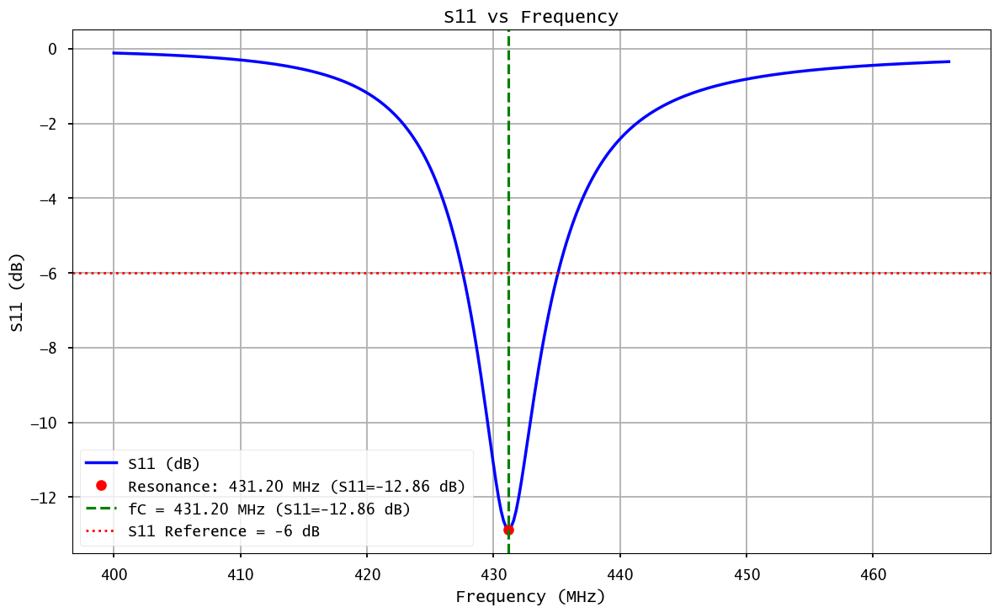


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 67                                                                   
L = 6.61 nH, C = 20.61 pF


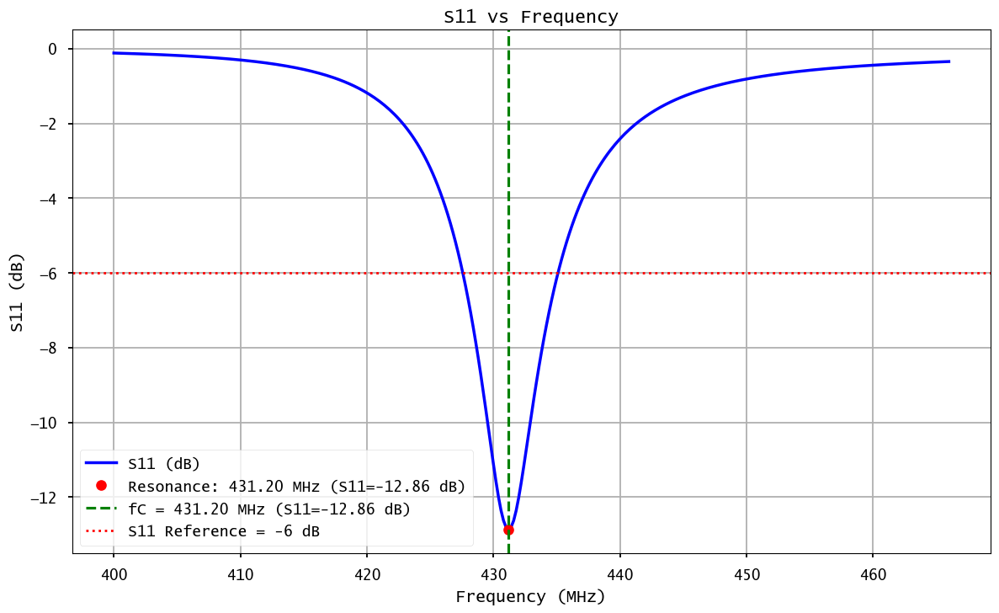


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 68                                                                   
L = 6.71 nH, C = 20.30 pF


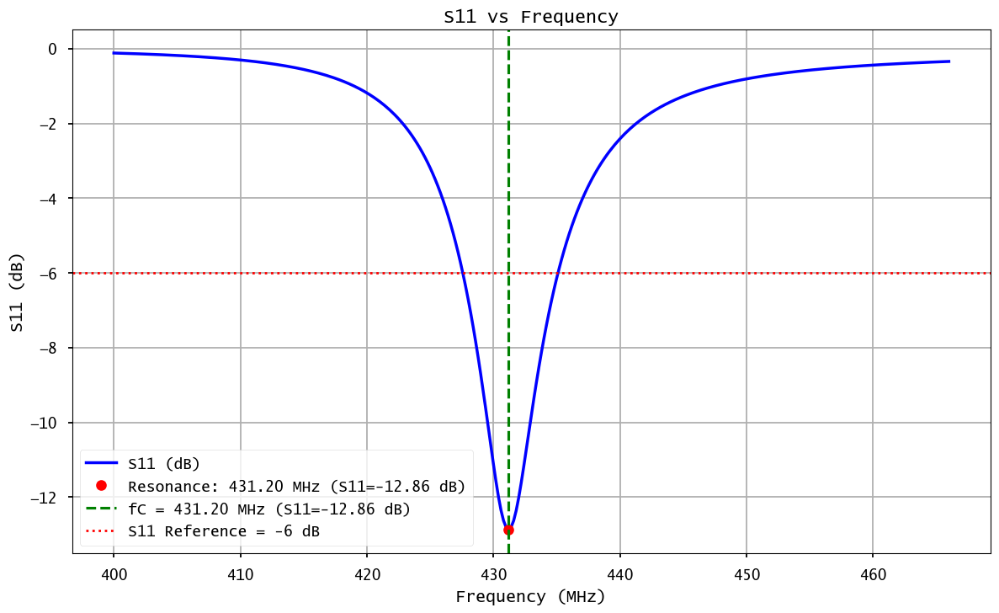


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 69                                                                   
L = 6.81 nH, C = 20.00 pF


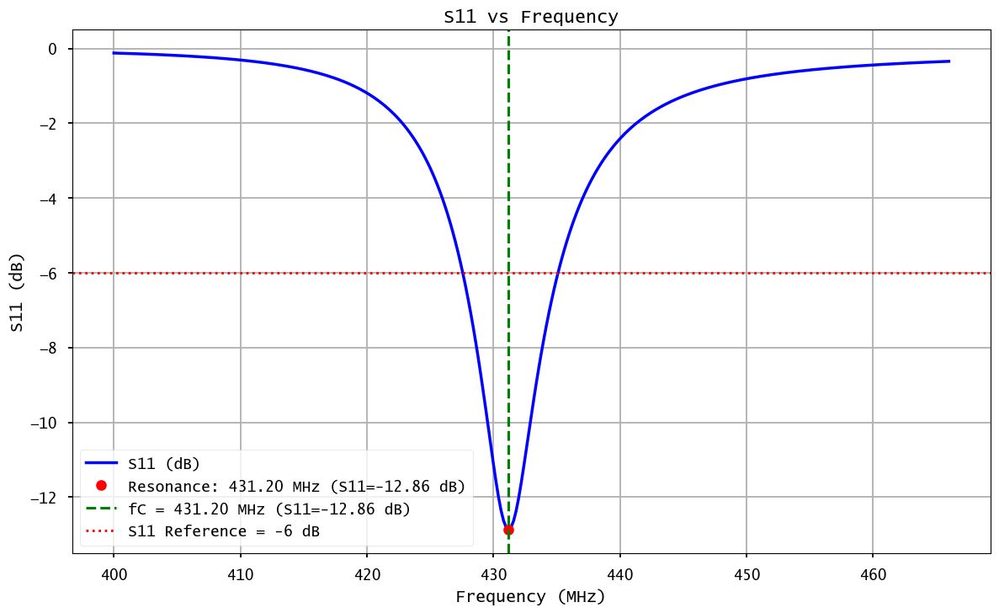


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 70                                                                   
L = 6.91 nH, C = 19.72 pF


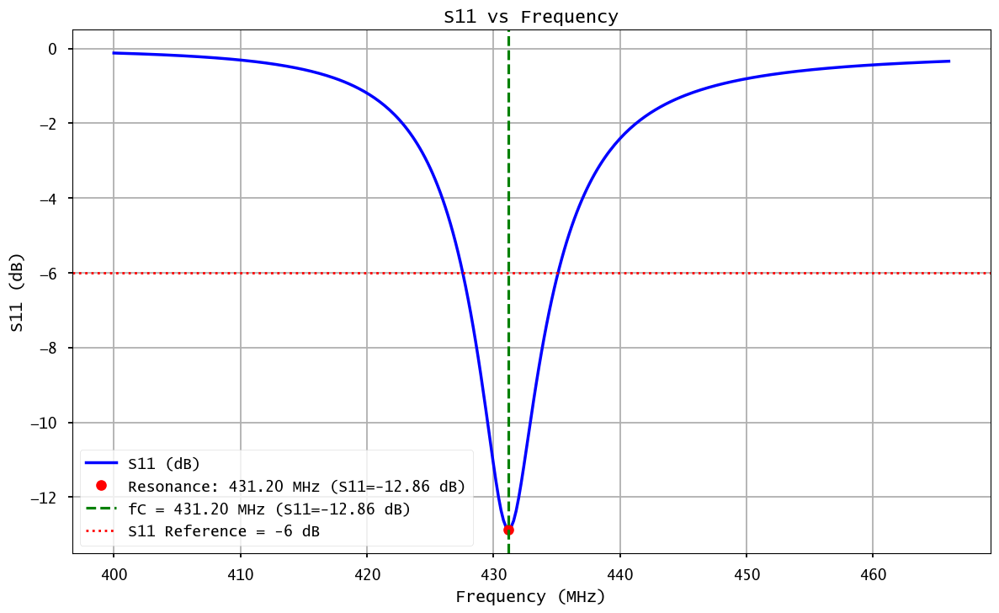


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 71                                                                   
L = 7.01 nH, C = 19.43 pF


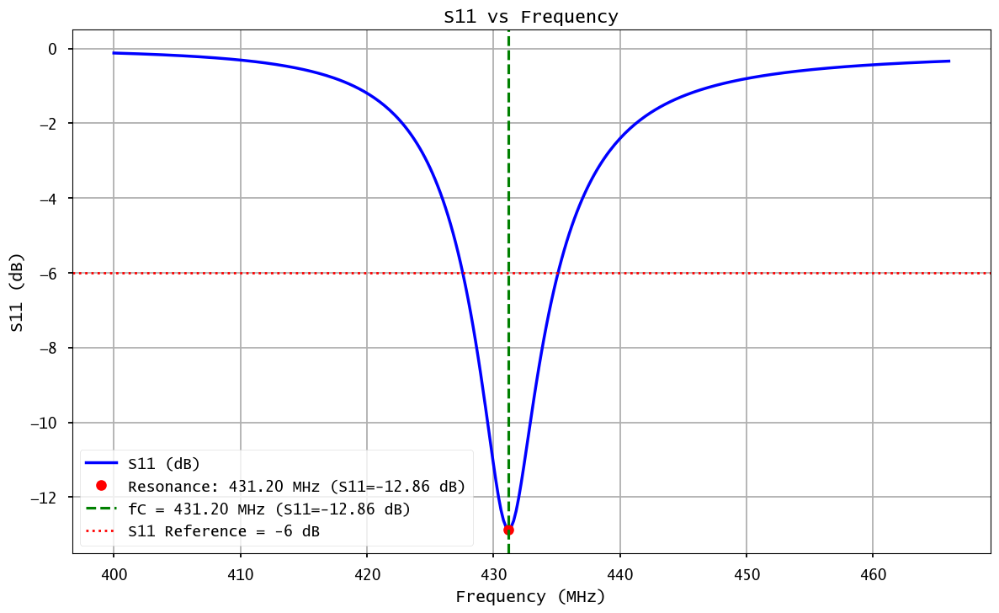


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 72                                                                   
L = 7.11 nH, C = 19.16 pF


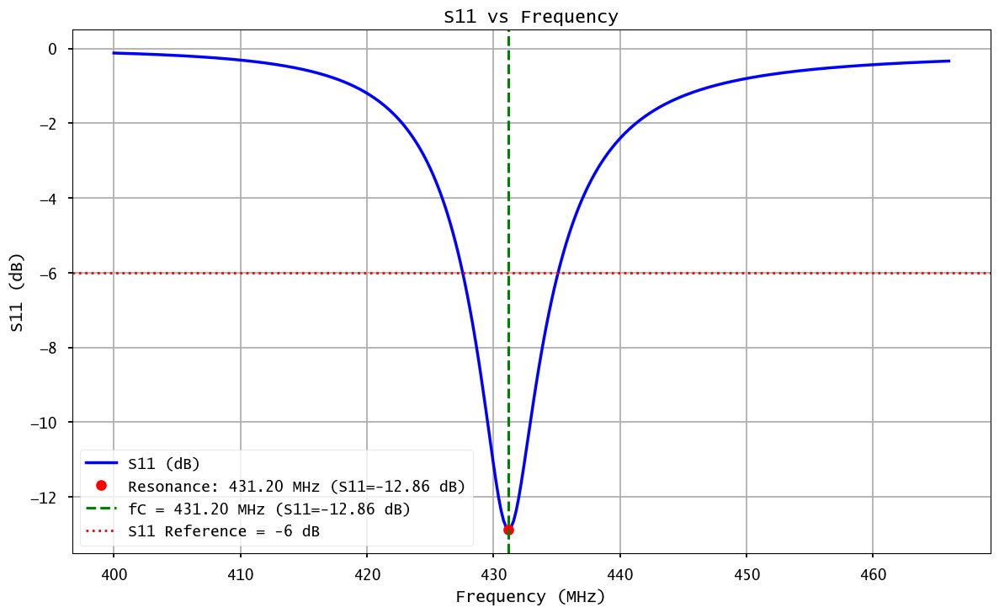


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 73                                                                   
L = 7.21 nH, C = 18.90 pF


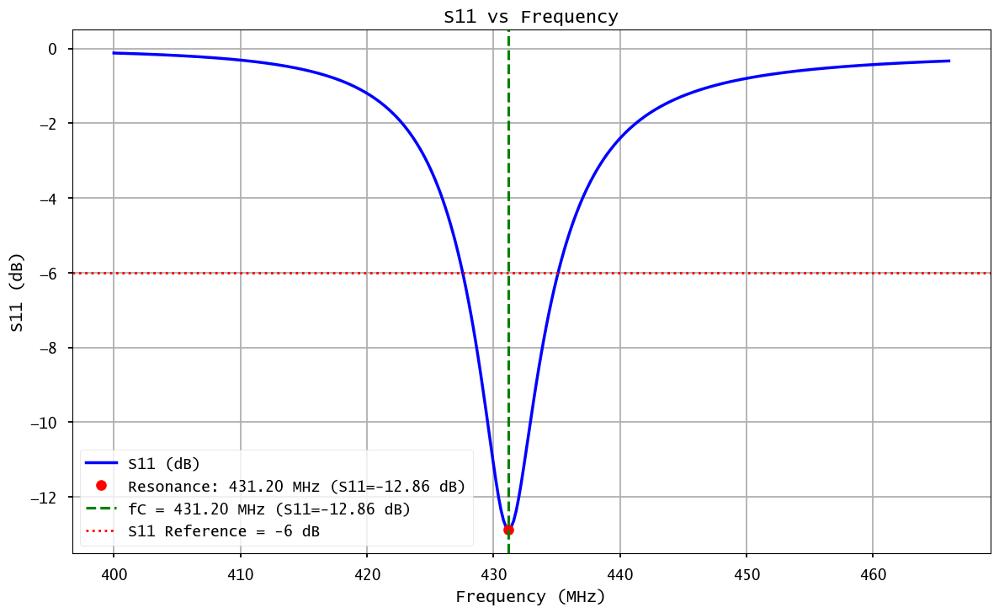


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 74                                                                   
L = 7.31 nH, C = 18.64 pF


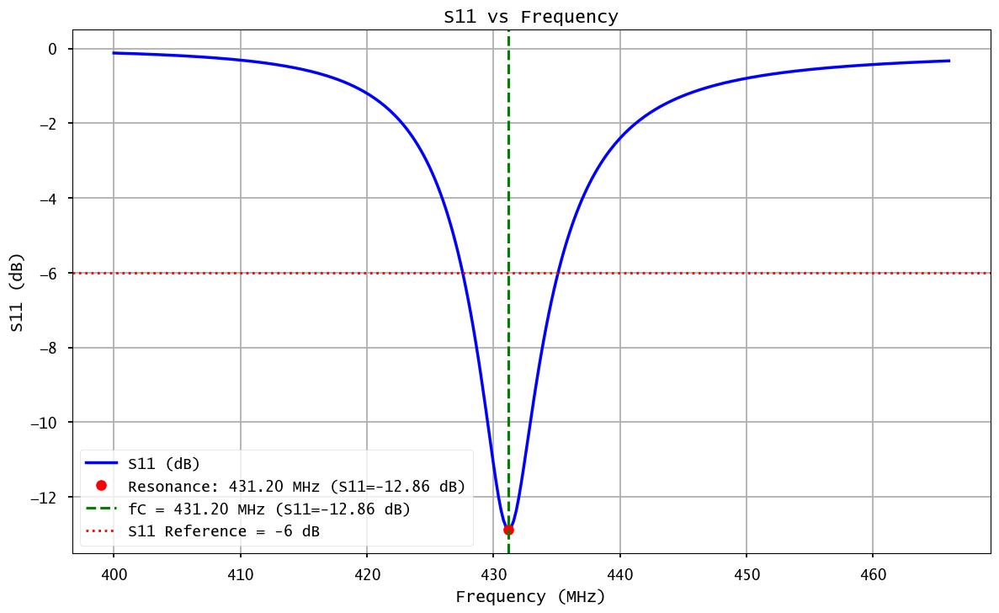


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 75                                                                   
L = 7.41 nH, C = 18.39 pF


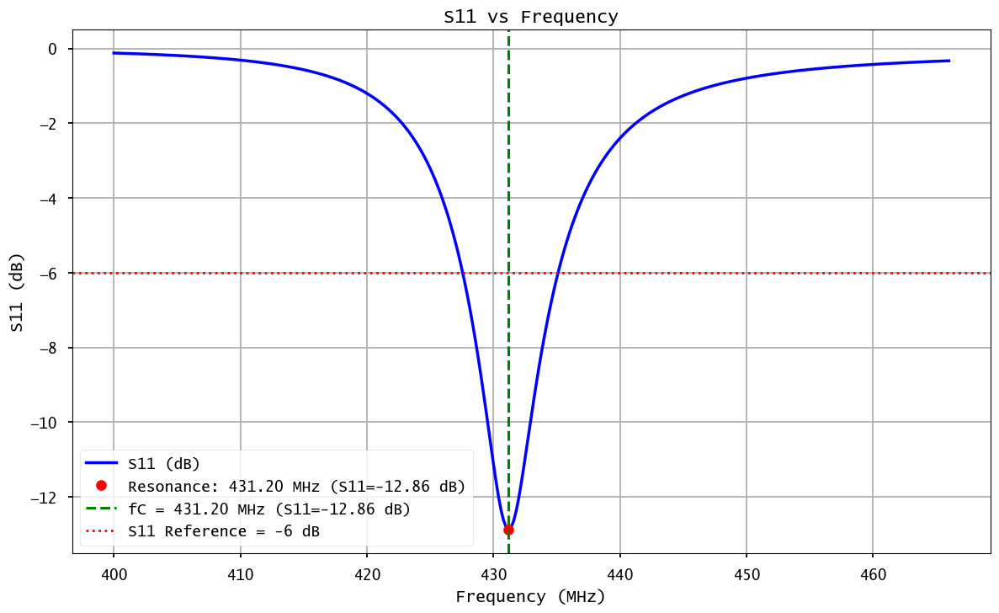


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 76                                                                   
L = 7.51 nH, C = 18.14 pF


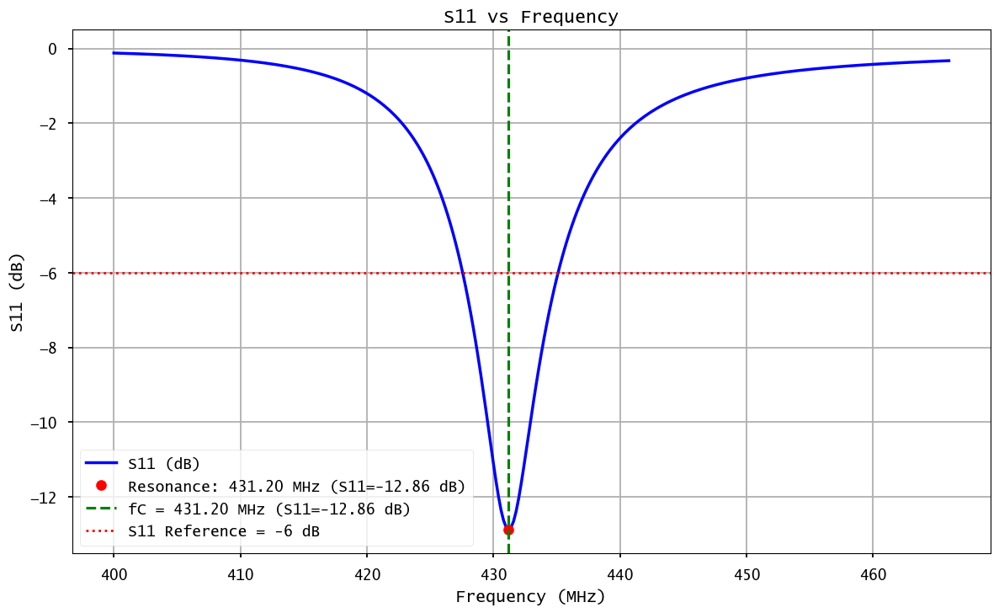


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 77                                                                   
L = 7.61 nH, C = 17.90 pF


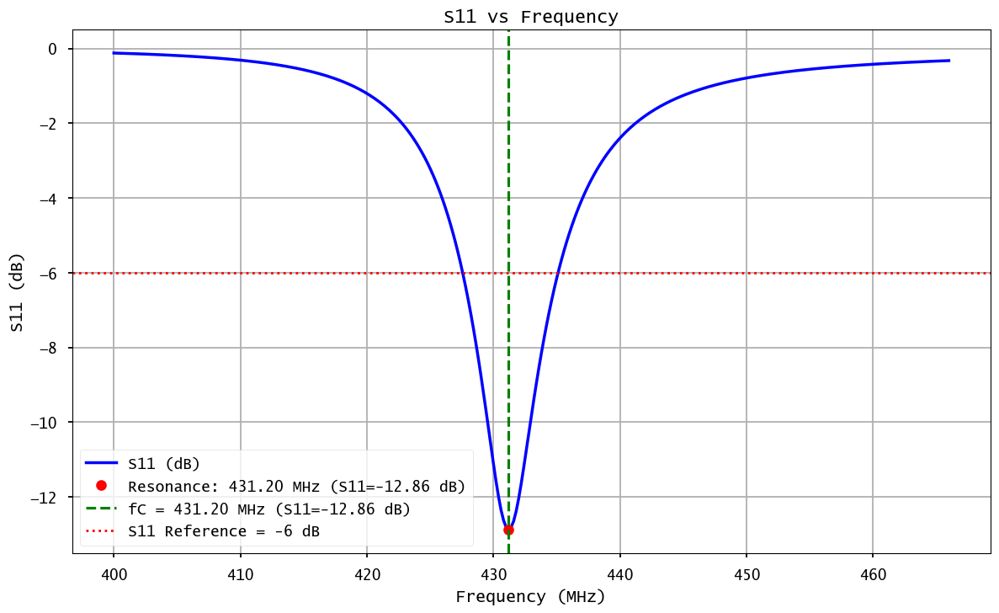


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 78                                                                   
L = 7.71 nH, C = 17.67 pF


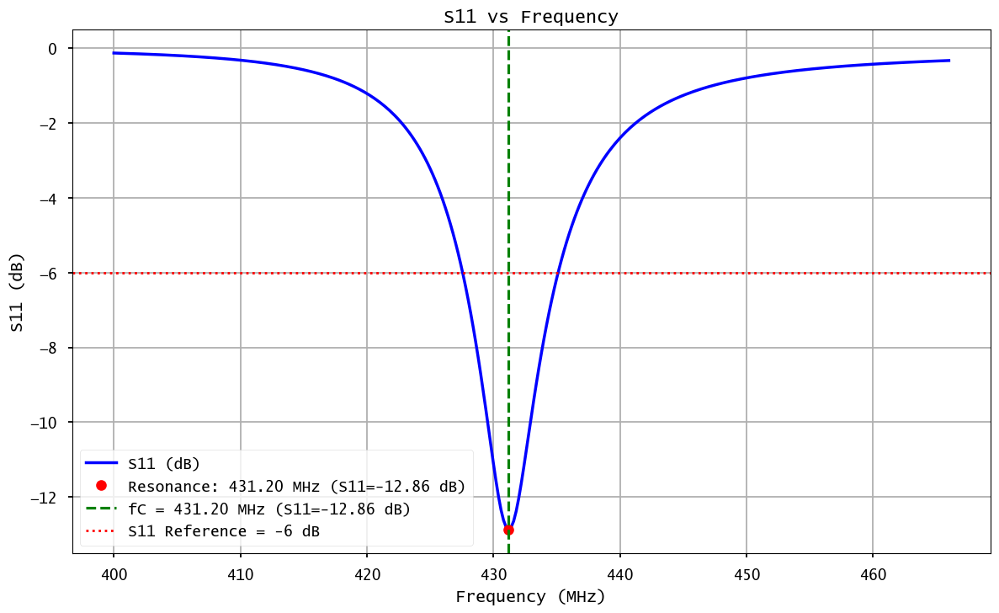


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 79                                                                   
L = 7.81 nH, C = 17.44 pF


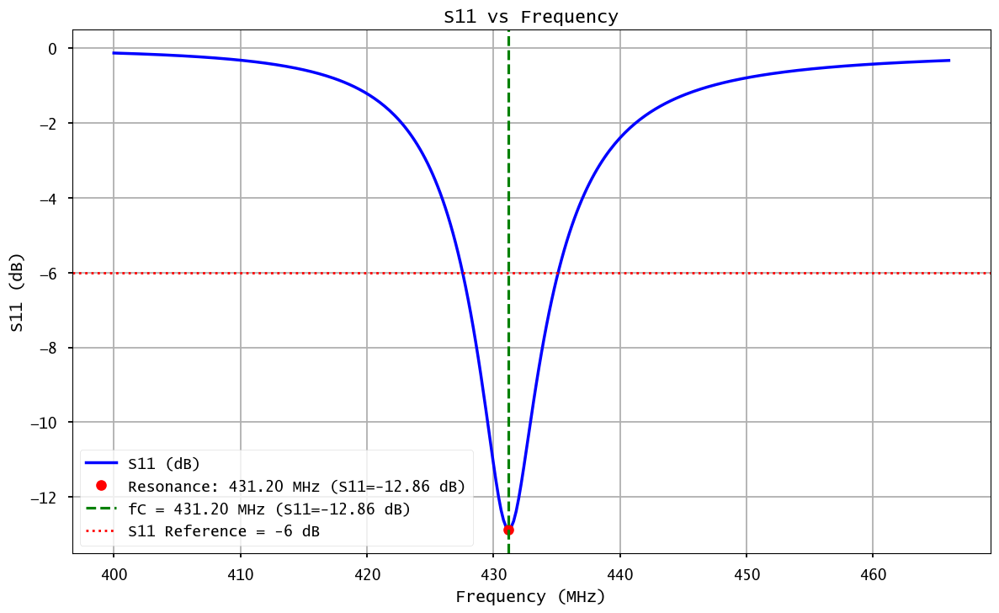


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 80                                                                   
L = 7.91 nH, C = 17.22 pF


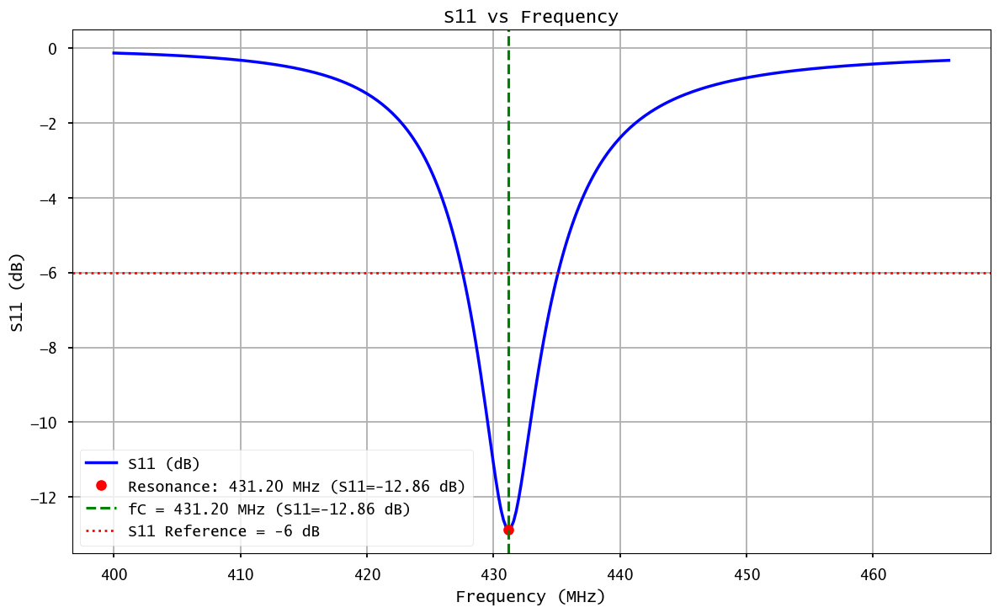


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 81                                                                   
L = 8.01 nH, C = 17.01 pF


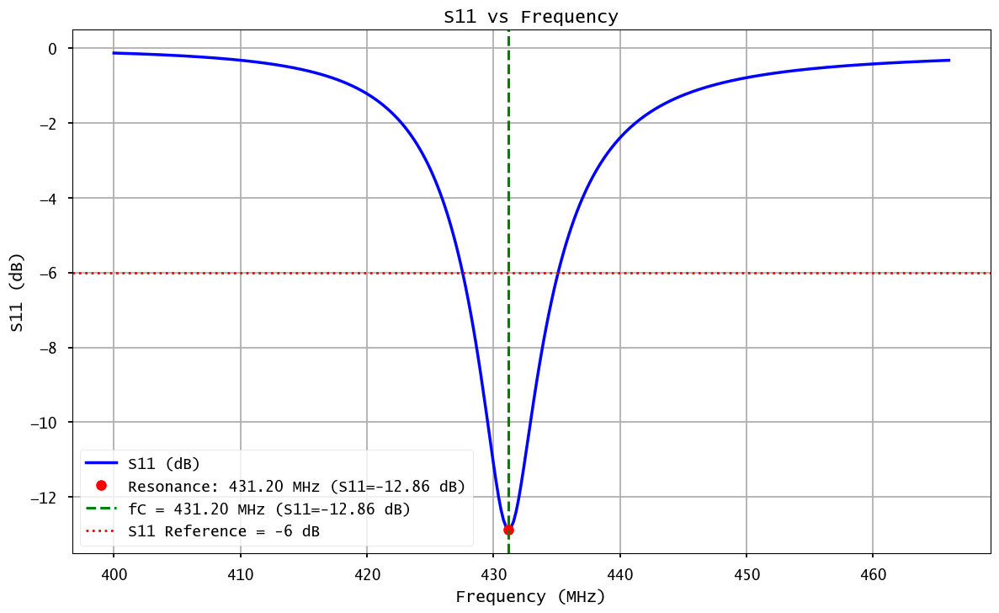


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 82                                                                   
L = 8.11 nH, C = 16.80 pF


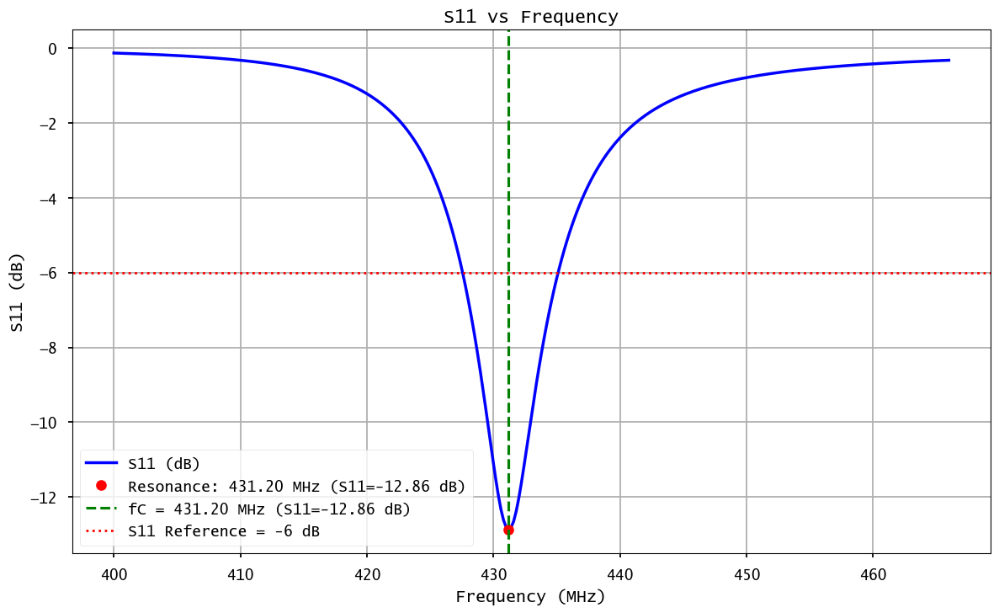


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 83                                                                   
L = 8.21 nH, C = 16.59 pF


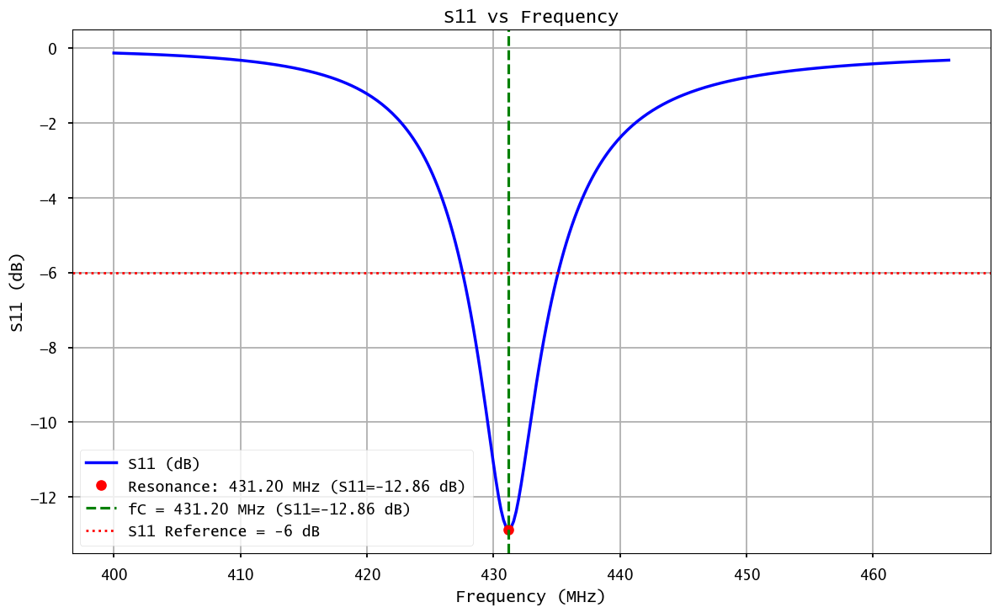


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 84                                                                   
L = 8.31 nH, C = 16.39 pF


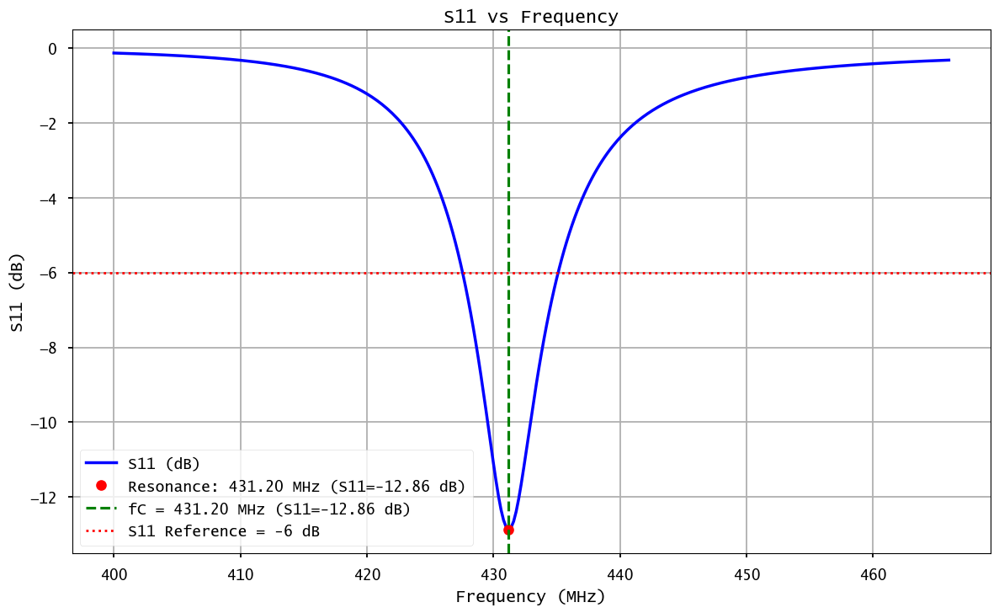


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 85                                                                   
L = 8.41 nH, C = 16.20 pF


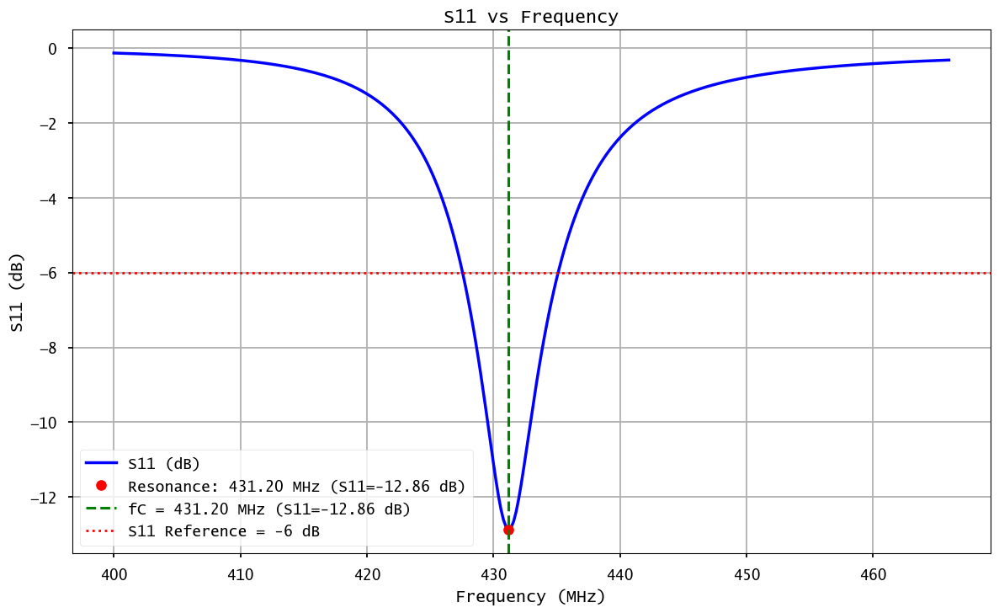


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 86                                                                   
L = 8.51 nH, C = 16.01 pF


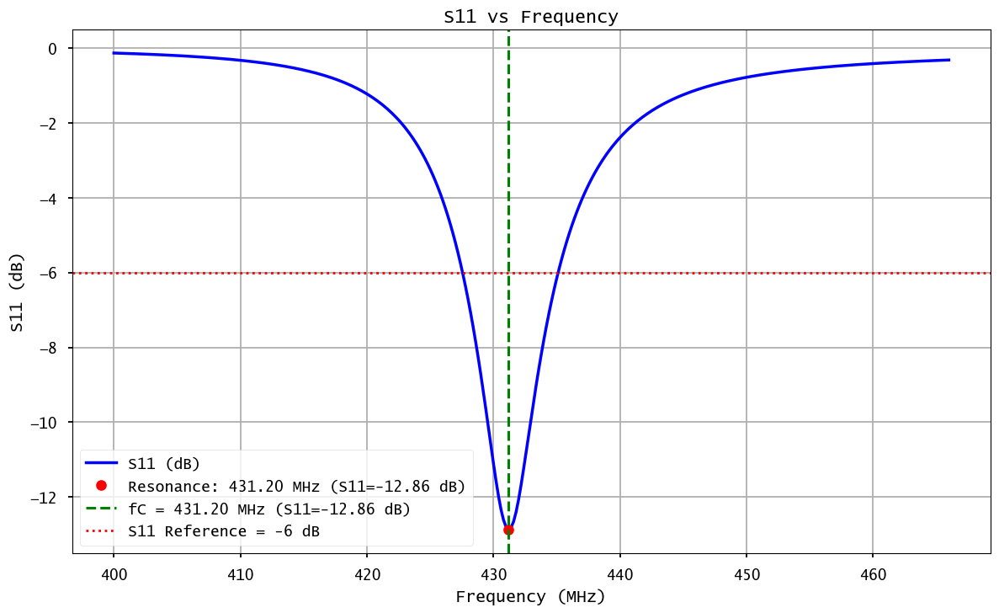


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 87                                                                   
L = 8.61 nH, C = 15.82 pF


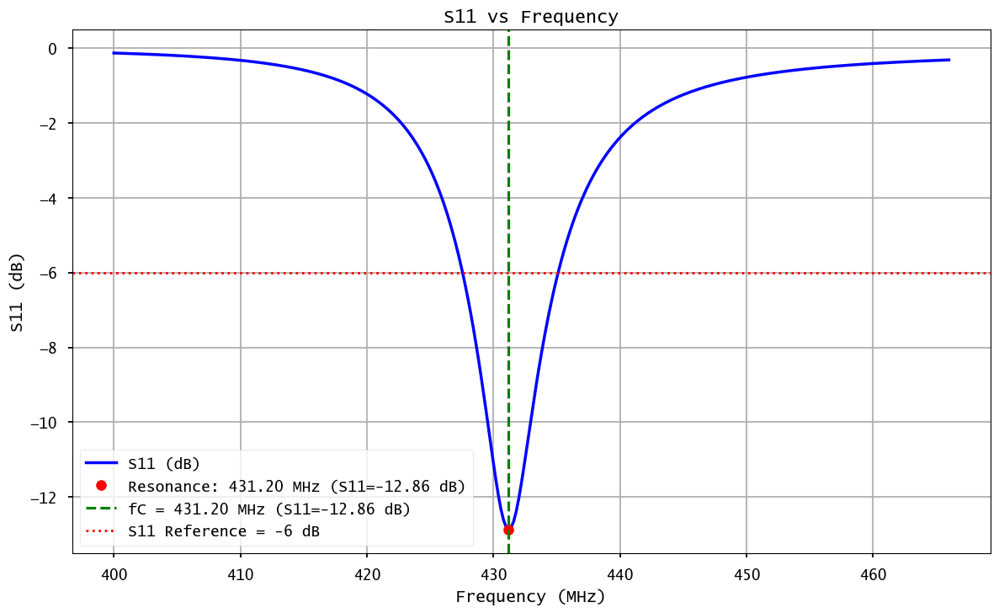


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 88                                                                   
L = 8.71 nH, C = 15.64 pF


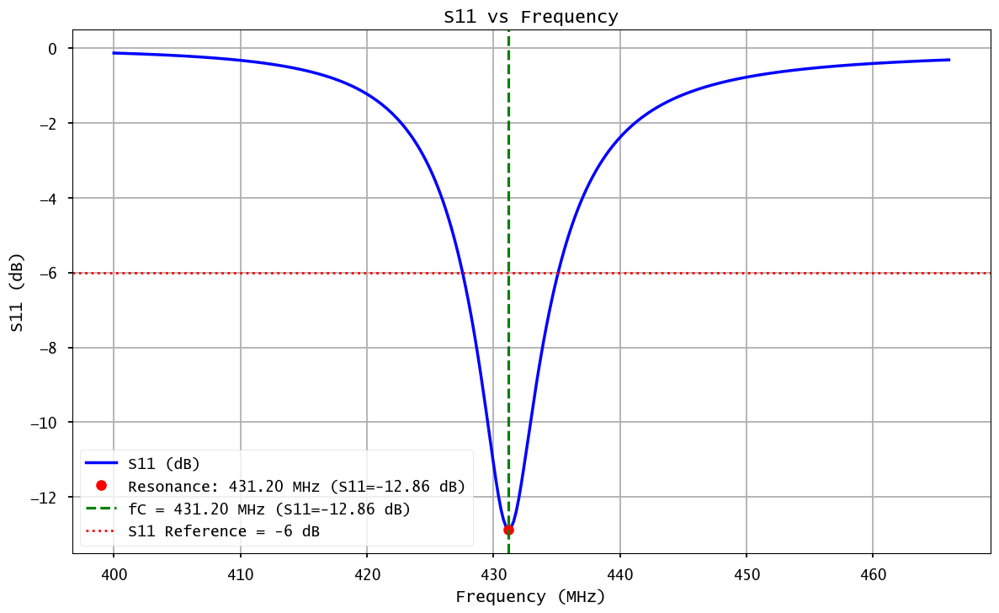


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 89                                                                   
L = 8.81 nH, C = 15.46 pF


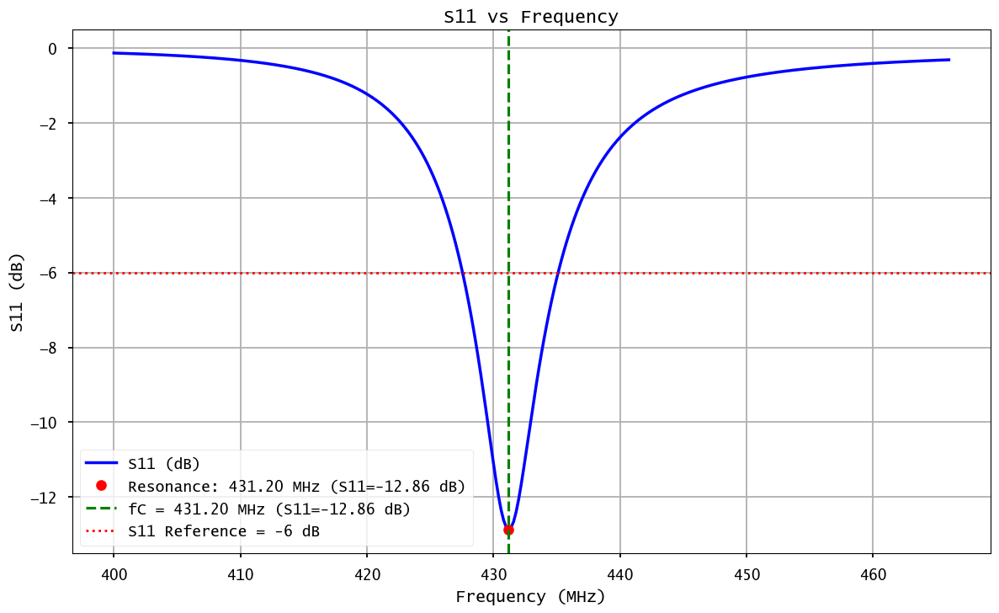


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 90                                                                   
L = 8.91 nH, C = 15.29 pF


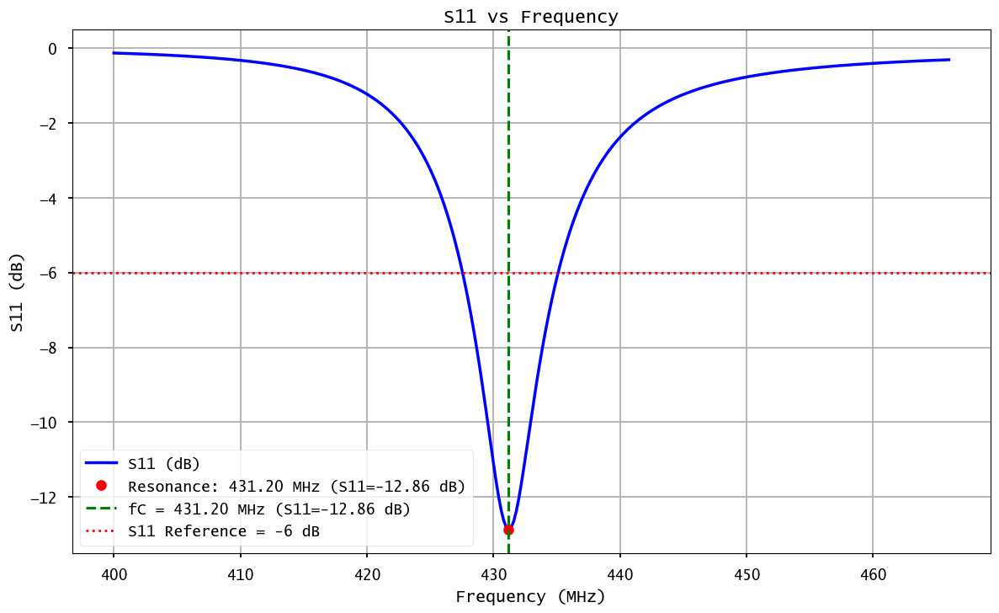


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 91                                                                   
L = 9.01 nH, C = 15.12 pF


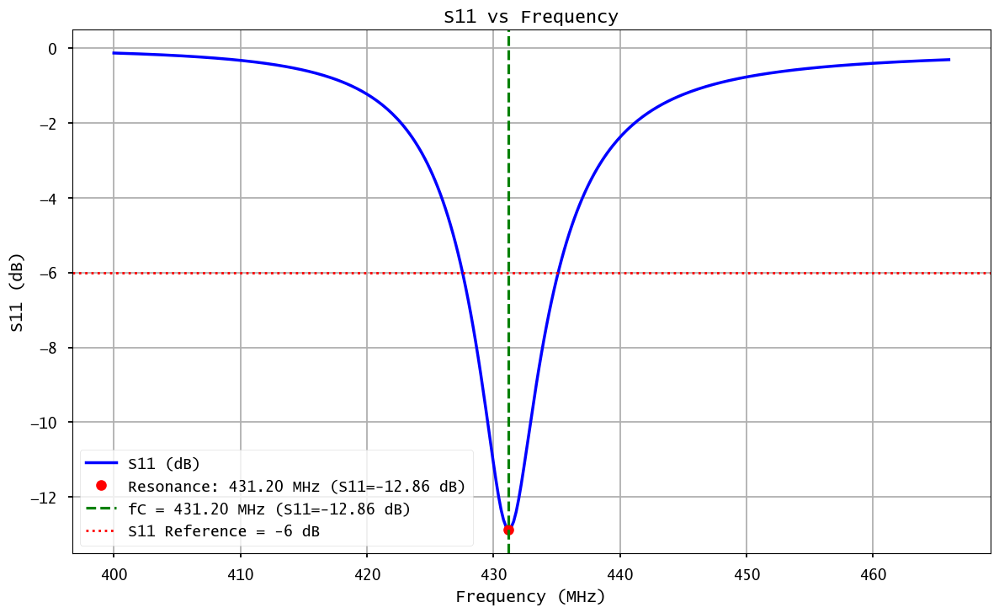


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 92                                                                   
L = 9.11 nH, C = 14.95 pF


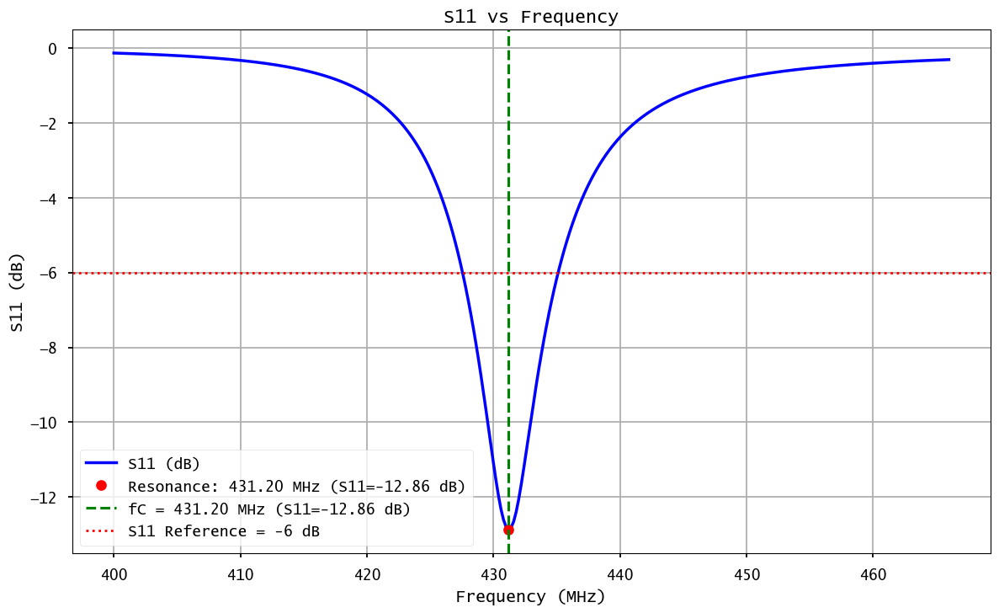


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 93                                                                   
L = 9.21 nH, C = 14.79 pF


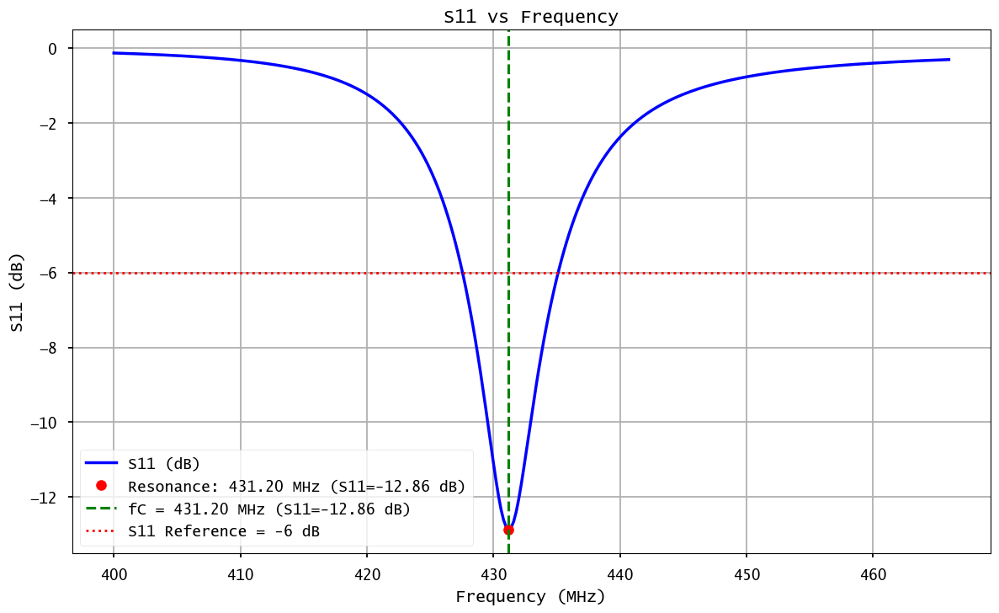


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 94                                                                   
L = 9.31 nH, C = 14.63 pF


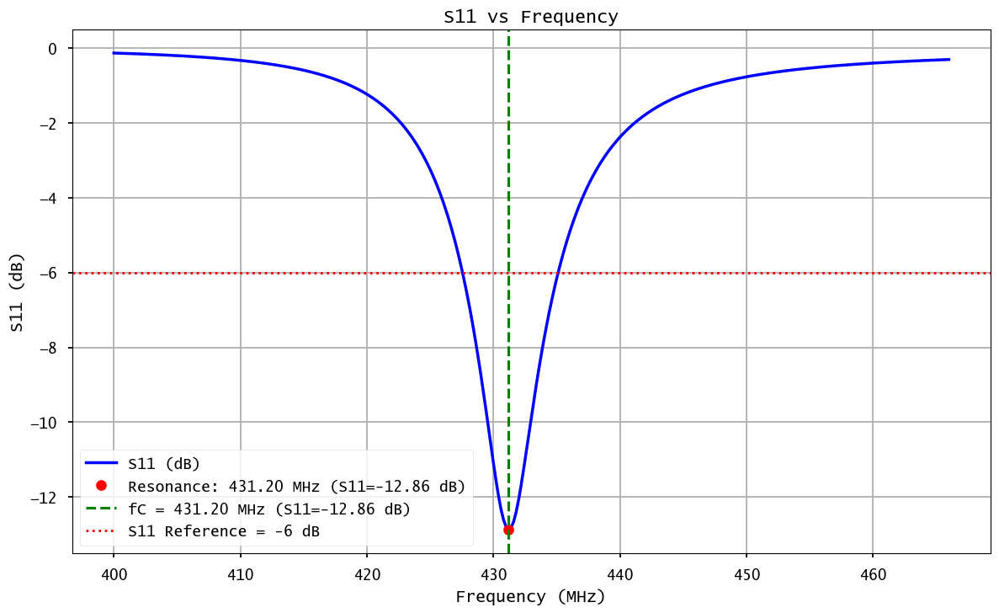


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 95                                                                   
L = 9.41 nH, C = 14.48 pF


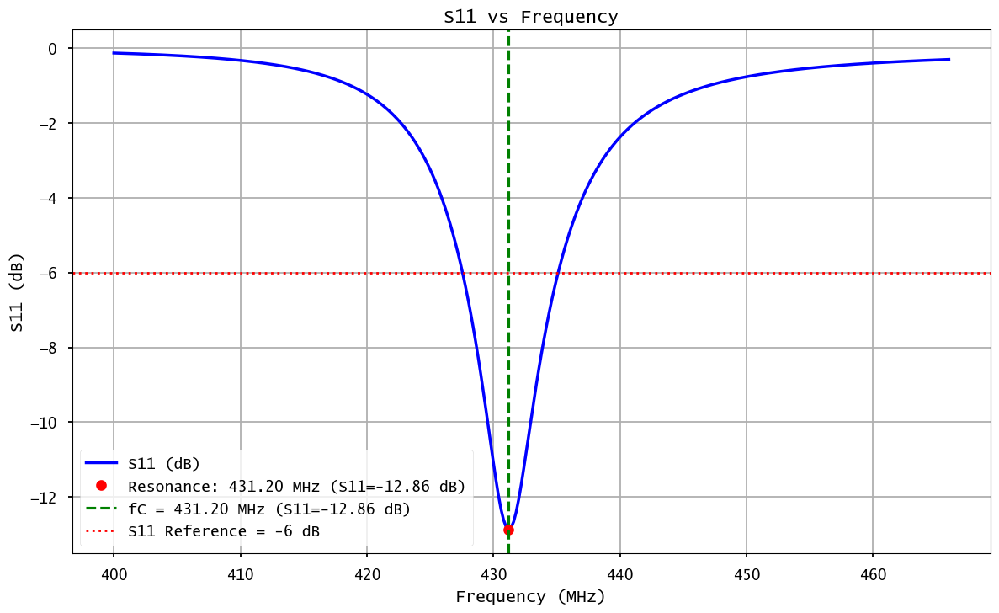


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 96                                                                   
L = 9.51 nH, C = 14.33 pF


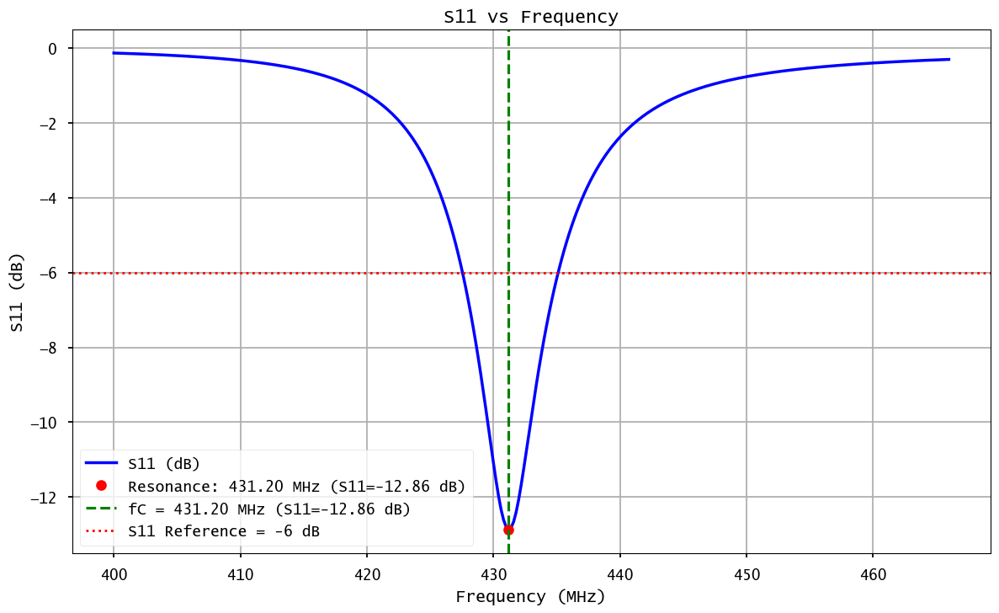


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 97                                                                   
L = 9.61 nH, C = 14.18 pF


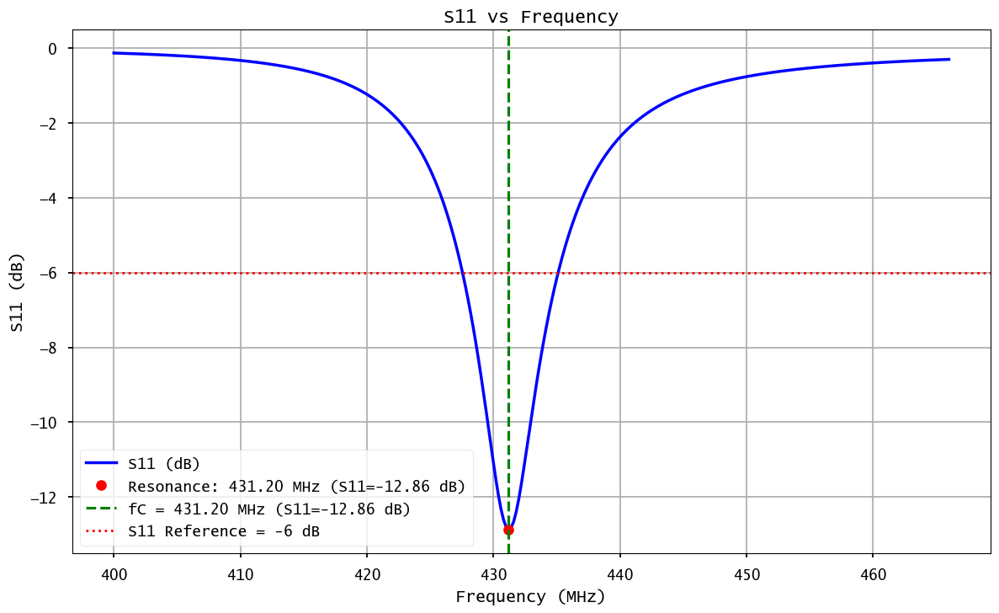


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 98                                                                   
L = 9.71 nH, C = 14.03 pF


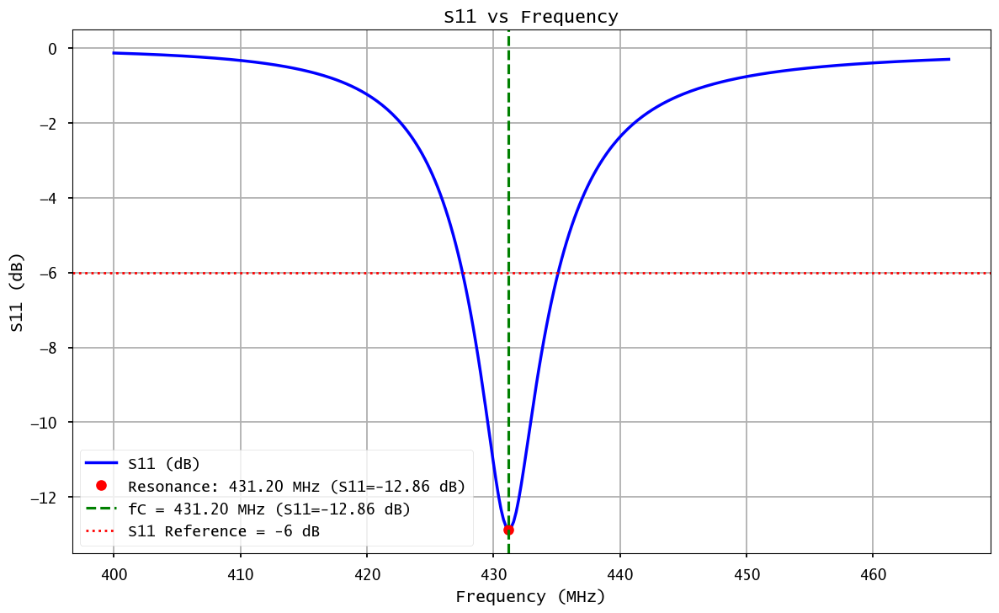


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 99                                                                   
L = 9.81 nH, C = 13.89 pF


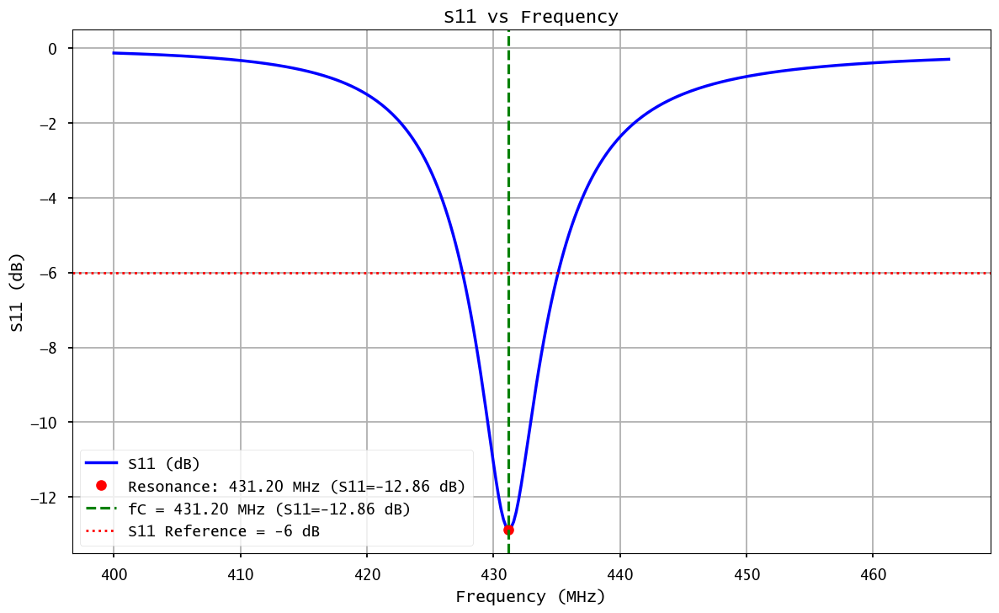


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB


                                                                   Iteration 100                                                                   
L = 9.91 nH, C = 13.75 pF


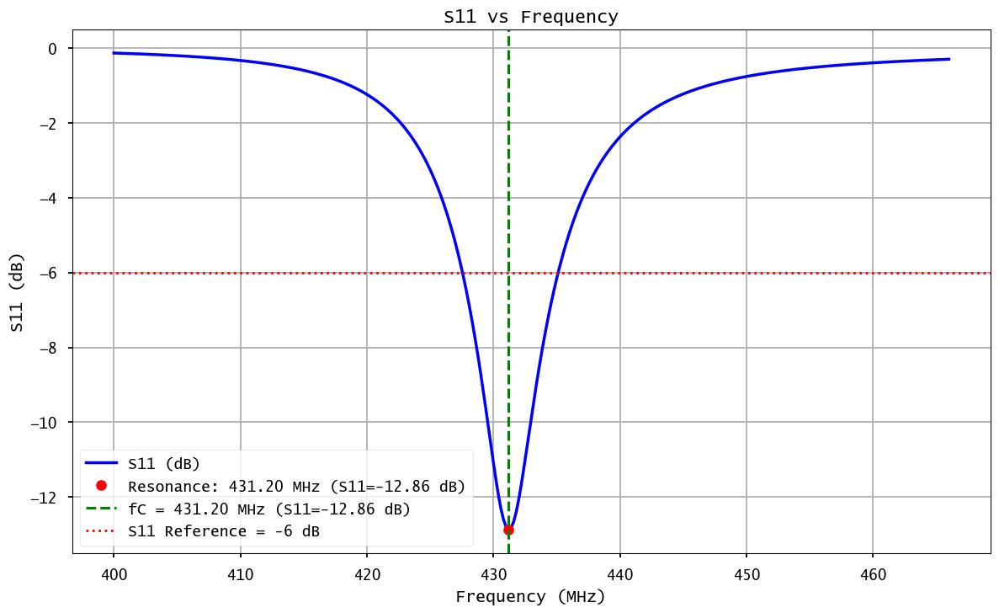


🔹 Bandwidth: 7.40 MHz
   - f_min = 0.428 GHz
   - f_max = 0.435 GHz
   - Threshold = -6 dB



In [29]:
iterations = 1
freq_calculation = fC  # Frequency at which we want to match

# loop to vary L and calculate C for matching at fC
for L_nH in np.arange(0.01, 10, 0.1):
    text = f"                                                                   Iteration {iterations}                                                                   "
    line = "=" * len(text)
    print(f"\n{line}\n{text}\n{line}")

    iterations += 1
    L_H = L_nH * 1e-9  # Convert to Henry
    # formula to find C_pF
    C_F = 1 / ((2 * np.pi * freq_calculation)**2 * L_H)  # in Farads
    print(f"L = {L_H*1e9:.2f} nH, C = {C_F*1e12:.2f} pF")

    # Add series capacitor
    # impedances_matched = add_series_capacitor(last_impedances, frequencies, C_F)
    impedances_matched = add_parallel_capacitor_inductor(impedances_simulated, frequencies, C_F, L_H)

    # Calculate matched S11
    s11_db_matched, s11_matched = calculate_s11_db(impedances_matched, z0=Z_adapt)
    plot_s11_curve(s11_db_matched, fLow, fHigh, fC, show_min=True, s11_reference=-6, show_reference=True)
    plot_smith_chart(impedances_matched, frequencies, fC, Z0=Z_adapt)
    calculate_bandwidth(frequencies, s11_db_matched, threshold=-6)

# put inductance and capacitance to make double tuning matching

# loop to vary L and calculate C for matching at fC

iterations = 1

for C_pF in np.arange(0.01, 100, 0.5):
    print(f"\n--- Iteration {iterations} ---")
    iterations += 1
    C_F = C_pF * 1e-12  # Convert to Farads
    # formula to find L_nF
    L_H = 1 / ((2 * np.pi * fC)**2 * C_F)  # in Henry
    print(f"C = {C_pF:.2f} pF, L = {L_H*1e9:.2f} nH")

    # Add series capacitor
    # impedances_matched = add_series_capacitor(last_impedances, frequencies, C_F)
    impedances_matched = add_parallel_capacitor_inductor(impedances_simulated, frequencies, C_F, L_H)

    # Calculate matched S11
    s11_db_matched, s11_matched = calculate_s11_db(impedances_matched, z0=25)
    # affichage of the type of s11
    plot_s11_curve(s11_db_matched, fLow, fHigh, fC, show_min=True)
    plot_smith_chart(impedances_matched, frequencies, fC, Z0=25)

# Load CST data
cst_data_1 = np.loadtxt("data/plot_file/Plot_S11_Antenne_Ta_89_Tb_44_a_29.txt", skiprows=3)
# cst_data_1 = np.loadtxt("data/plot_file/Plot_S11_Antenne_Ta_92_Tb_55_a_27.txt", skiprows=3)
cst_freq_mhz = cst_data_1[:, 0]  # frequency already in MHz
cst_s11_db = cst_data_1[:, 1]

# Load S1P data
s1p_data = np.loadtxt("data/plot_file/IFA_1.s1p", comments='!', skiprows=5)
Experimentation_freq_mhz = s1p_data[:, 0] / 1e6  # frequency in MHz
Experimentation_s11_db = s1p_data[:, 1]

# Mask between fLow and fHigh
mask = (Experimentation_freq_mhz >= fLow / 1e6) & (Experimentation_freq_mhz <= fHigh / 1e6)
Experimentation_freq_mhz = Experimentation_freq_mhz[mask]
Experimentation_s11_db = Experimentation_s11_db[mask]

# plot_s11_curve_CST_MoM(s11_db, fLow, fHigh, cst_freq_mhz=cst_freq_mhz, cst_s11_db=cst_s11_db)
plot_s11_curve_MoM_vs_Experiment(s11_db, fLow, fHigh, s11_db_exp=Experimentation_s11_db, exp_freq_mhz=Experimentation_freq_mhz)


simulate_efficiency(frequencies, ifa_meander_mat, fC, feed_point, save_image=True)

# Étape 2 : Distribution de l'intensité du rayonnement sur une sphère
from efield.efield2 import radiation_intensity_distribution_over_sphere_surface
from efield.efield3 import antenna_directivity_pattern

impedance, *_ = radiation_algorithm(ifa_meander_mat, 868e6, feed_point, voltage_amplitude=0.5, show=True)

ifa_meander_mesh2 = 'data/antennas_mesh2/sim_optimize_ifa_mesh2.mat'
ifa_meander_current = 'data/antennas_current/sim_optimize_ifa_current.mat'
ifa_meander_gain_power = 'data/antennas_gain_power/sim_optimize_ifa_gain_power.mat'
filename_sphere_dense = '../../data/sphere_mesh/sphere_dense.mat'

# Étape 2 : Distribution de l'intensité du rayonnement sur une sphère
print("Calculating radiation intensity distribution over sphere surface...")
radiation_intensity_distribution_over_sphere_surface(ifa_meander_mesh2, ifa_meander_current, filename_sphere_dense, radiation=True, save_image=False)

# Étape 3 : Génération du diagramme de directivité
print("Generating antenna directivity pattern...")
antenna_directivity_pattern(ifa_meander_mesh2, ifa_meander_current, ifa_meander_gain_power, radiation=True)